# скрипт #03 v_2
<hr>

# страндарные библиотеки для работы

In [1]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt

from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

from IPython.core.display import HTML

In [2]:
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

In [3]:
# sklearn packages
from sklearn import preprocessing
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer

In [4]:
fileNames=['rawDataFull1001.csv', 'rawDataFull1003.csv', 
            'rawDataFull1004.csv', 'rawDataFull1005.csv',
            'rawDataFull1006.csv']
path='../ITC RUSAL/baths_v2/'
bathNumber=['1001','1003','1004','1005','1006']

In [5]:
# data[0] - 1001, 1 - 1003, 2 - 1004, 3 - 1005, 4 - 1006
data=[]
for dataset in fileNames:
    data.append(pd.read_csv(path+dataset))

In [6]:
# удалить столбец "KOL4", т.к. он пустой по всех 5ти наборах
for i in range(5):
    data[i]=data[i].drop(columns=['KOL4'])

In [7]:
fullNames=['АЭ: длит. <Сред.>', 'АЭ: кол-во <Сред.>', 'АЭ: напр. ср.м. <Сред.>(В)',
            'Время в недопитке <Сред.> (час)', 'Время в номинале <Сред.> (час)',
            'Время  в перепитке <Сред.> (час)', 'Время в тесте <Сред.> (час)', 
            'Время на голод. <Сред.> (час)', 'Кол-во доз АПГ в недопитке <Сумма> (шт.)',
            'Кол-во доз АПГ в номинале <Сумма> (шт.)', 'Кол-во доз АПГ в перепитке <Сумма> (шт.)',
            'Кол-во доз АПГ в тесте <Сумма> (шт.)', 'Напр. зад. <Сред.> (В)', 'Напр. эл-ра <Сред.> (В)',
            'Настыль: длина <Сред.> (см)', 'Подина: состояние <Сред.> (оц.)', 
            'РМПР: длит. ВИРА <Сред.> (сек)', 'РМПР: длит. МАЙНА <Сред.> (сек)', 
            'РМПР: коэфф. <Сред.>', 'РМПР: кол-во ВИРА <Сред.> (шт)', 'РМПР: кол-во МАЙНА <Сред.> (шт)',
            'Эл-лит: темп-ра <Сред.> (°C)', 'Металл: уровень <Сред.> (см)', 'Эл-лит: уровень <Сред.> (см)', 
            'Шум <Сред.> (В)', 'Эл-лит: CaF2 <Сред.> (%)', 'Эл-лит: КО <Сред.>', 'AlF3: добавка <Сред.> (кг)',
            'Напр. анода <Сред.> (В)' ]
fullNames_2=['Выход на в.сутки: Кр/весы <Сред.> (кг)', 'Выход на в.сутки: Л/О <Сред.> (кг)',
            'Выход на в.сутки: по заданию <Сред.> (кг)', 'Выход по току: Л/О <Сред.> (%)',
            'Ток серии (АСУТП) <Сред.> (кА)']

In [8]:
fullNames.remove('Кол-во доз АПГ в тесте <Сумма> (шт.)')
fullNamesInRussian=fullNames+fullNames_2

##  нормализуем в $[0,1]$

In [9]:
dataScaled=[]
for i in range(5):
    x=data[i].values
    scaler = preprocessing.MinMaxScaler()
    x_scaled = scaler.fit_transform(x)
    dataScaled.append( pd.DataFrame(x_scaled, columns=data[i].columns.values) )

## заполним пропусти средним и с помощью метода kNN: k=3

In [10]:
dataScImpMean=[]
for i in range(5):
    impMean = SimpleImputer(missing_values=np.nan, strategy='mean')
    dataScImpMean.append( pd.DataFrame(impMean.fit_transform(dataScaled[i]), columns=dataScaled[i].columns.values) )

In [11]:
dataScImpKNN3=[]
for i in range(5):
    impKNN3 = KNNImputer(missing_values=np.nan, n_neighbors=3)
    dataScImpKNN3.append( pd.DataFrame(impKNN3.fit_transform(dataScaled[i]), columns=dataScaled[i].columns.values) )

## массив 5-в-1 c пропусками и заполненный

In [12]:
data5in1=dataScaled[0].copy()
for i in range(4):
    data5in1=data5in1.append(dataScaled[i+1], ignore_index=True)
data5in1.info(verbose=False)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1825 entries, 0 to 1824
Columns: 33 entries, AE1 to CURRENT2
dtypes: float64(33)
memory usage: 470.6 KB


In [13]:
impMean = SimpleImputer(missing_values=np.nan, strategy='mean')
data5ni1Mean=pd.DataFrame(impMean.fit_transform(data5in1), columns=data5in1.columns.values)

In [14]:
impKNN3 = KNNImputer(missing_values=np.nan, n_neighbors=3)
data5ni1KNN3=pd.DataFrame(impKNN3.fit_transform(data5in1), columns=data5in1.columns.values)

# Некоторые модели машинного обучения по данным $ X(t) \rightarrow Y(t) $

In [15]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

from sklearn.model_selection import GridSearchCV

In [16]:
from sklearn.decomposition import PCA
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.linear_model import LinearRegression

In [17]:
trainImpMean=[None]*5
testImpMean=[None]*5
for i in range(5):
    trainImpMean[i], testImpMean[i] = train_test_split(dataScImpMean[i], test_size=0.25)
train5in1ImpMean, test5in1ImpMean = train_test_split(data5ni1Mean, test_size=0.25)

In [18]:
trainImpKNN3=[None]*5
testImpKNN3=[None]*5
for i in range(5):
    trainImpKNN3[i], testImpKNN3[i] = train_test_split(dataScImpKNN3[i], test_size=0.25)
train5in1ImpKNN3, test5in1ImpKNN3 = train_test_split(data5ni1KNN3, test_size=0.25)

## линейная модель (оценка снизу)

In [19]:
# заполнение средним
# для параметра EKO
modelLinearMeanEKO=[None]*6
rmseLinearMeanEKO=[None]*6
r2scoreLinearMeanEKO=[None]*6

# для параметра ETEMP
modelLinearMeanETEMP=[None]*6
rmseLinearMeanETEMP=[None]*6
r2scoreLinearMeanETEMP=[None]*6

# заполнение KNN3
# для параметра EKO
modelLinearKNN3EKO=[None]*6
rmseLinearKNN3EKO=[None]*6
r2scoreLinearKNN3EKO=[None]*6

# для параметра ETEMP
modelLinearKNN3ETEMP=[None]*6
rmseLinearKNN3ETEMP=[None]*6
r2scoreLinearKNN3ETEMP=[None]*6

for i in range(5):

    # заполнение средним
    # по параметру EKO по ваннам
    trainInputsEKO = trainImpMean[i].drop(columns=['EKO','ETEMP']).values
    testInputsEKO = testImpMean[i].drop(columns=['EKO','ETEMP']).values
    trainTargetsEKO = trainImpMean[i]['EKO'].values
    testTargetsEKO = testImpMean[i]['EKO'].values
    
    modelLinearMeanEKO[i] = LinearRegression()
    modelLinearMeanEKO[i].fit(trainInputsEKO,trainTargetsEKO)
    predictedEKO = modelLinearMeanEKO[i].predict(testInputsEKO)
    
    rmseLinearMeanEKO[i] = mean_squared_error(testTargetsEKO, predictedEKO, squared=False)
    r2scoreLinearMeanEKO[i] = r2_score(testTargetsEKO, predictedEKO)

    # по параметру ETEMP по ваннам
    trainInputsETEMP = trainImpMean[i].drop(columns=['EKO','ETEMP']).values
    testInputsETEMP = testImpMean[i].drop(columns=['EKO','ETEMP']).values
    trainTargetsETEMP = trainImpMean[i]['ETEMP'].values
    testTargetsETEMP = testImpMean[i]['ETEMP'].values
    
    modelLinearMeanETEMP[i] = LinearRegression()
    modelLinearMeanETEMP[i].fit(trainInputsETEMP,trainTargetsETEMP)
    predictedETEMP = modelLinearMeanETEMP[i].predict(testInputsETEMP)
    
    rmseLinearMeanETEMP[i] = mean_squared_error(testTargetsETEMP, predictedETEMP, squared=False)
    r2scoreLinearMeanETEMP[i] = r2_score(testTargetsETEMP, predictedETEMP)

    # заполнение KNN3
    # по параметру EKO по ваннам
    trainInputsEKO = trainImpKNN3[i].drop(columns=['EKO','ETEMP']).values
    testInputsEKO = testImpKNN3[i].drop(columns=['EKO','ETEMP']).values
    trainTargetsEKO = trainImpKNN3[i]['EKO'].values
    testTargetsEKO = testImpKNN3[i]['EKO'].values
    
    modelLinearKNN3EKO[i] = LinearRegression()
    modelLinearKNN3EKO[i].fit(trainInputsEKO,trainTargetsEKO)
    predictedEKO = modelLinearKNN3EKO[i].predict(testInputsEKO)
    
    rmseLinearKNN3EKO[i] = mean_squared_error(testTargetsEKO, predictedEKO, squared=False)
    r2scoreLinearKNN3EKO[i] = r2_score(testTargetsEKO, predictedEKO)

    # по параметру ETEMP по ваннам
    trainInputsETEMP = trainImpKNN3[i].drop(columns=['EKO','ETEMP']).values
    testInputsETEMP = testImpKNN3[i].drop(columns=['EKO','ETEMP']).values
    trainTargetsETEMP = trainImpKNN3[i]['ETEMP'].values
    testTargetsETEMP = testImpKNN3[i]['ETEMP'].values
    
    modelLinearKNN3ETEMP[i] = LinearRegression()
    modelLinearKNN3ETEMP[i].fit(trainInputsETEMP,trainTargetsETEMP)
    predictedETEMP = modelLinearKNN3ETEMP[i].predict(testInputsETEMP)
    
    rmseLinearKNN3ETEMP[i] = mean_squared_error(testTargetsETEMP, predictedETEMP, squared=False)
    r2scoreLinearKNN3ETEMP[i] = r2_score(testTargetsETEMP, predictedETEMP)    

# заполнение средним
# по параметру EKO 5-в-1
trainInputs5in1EKO = train5in1ImpMean.drop(columns=['EKO','ETEMP']).values
testInputs5in1EKO = test5in1ImpMean.drop(columns=['EKO','ETEMP']).values
trainTargets5in1EKO = train5in1ImpMean['EKO'].values
testTargets5in1EKO = test5in1ImpMean['EKO'].values

modelLinearMeanEKO[5] = LinearRegression()
modelLinearMeanEKO[5].fit(trainInputs5in1EKO, trainTargets5in1EKO)
predictedEKO = modelLinearMeanEKO[5].predict(testInputs5in1EKO)

rmseLinearMeanEKO[5] = mean_squared_error(testTargets5in1EKO, predictedEKO, squared=False)
r2scoreLinearMeanEKO[5] = r2_score(testTargets5in1EKO, predictedEKO)

# по параметру ETEMP 5-в-1
trainInputs5in1ETEMP = train5in1ImpMean.drop(columns=['EKO','ETEMP']).values
testInputs5in1ETEMP = test5in1ImpMean.drop(columns=['EKO','ETEMP']).values
trainTargets5in1ETEMP = train5in1ImpMean['ETEMP'].values
testTargets5in1ETEMP = test5in1ImpMean['ETEMP'].values

modelLinearMeanETEMP[5] = LinearRegression()
modelLinearMeanETEMP[5].fit(trainInputs5in1ETEMP, trainTargets5in1ETEMP)
predictedETEMP = modelLinearMeanETEMP[5].predict(testInputs5in1ETEMP)

rmseLinearMeanETEMP[5] = mean_squared_error(testTargets5in1ETEMP, predictedETEMP, squared=False)
r2scoreLinearMeanETEMP[5] = r2_score(testTargets5in1ETEMP, predictedETEMP)

# заполнение KNN
# по параметру EKO 5-в-1
trainInputs5in1EKO = train5in1ImpKNN3.drop(columns=['EKO','ETEMP']).values
testInputs5in1EKO = test5in1ImpKNN3.drop(columns=['EKO','ETEMP']).values
trainTargets5in1EKO = train5in1ImpKNN3['EKO'].values
testTargets5in1EKO = test5in1ImpKNN3['EKO'].values

modelLinearKNN3EKO[5] = LinearRegression()
modelLinearKNN3EKO[5].fit(trainInputs5in1EKO, trainTargets5in1EKO)
predictedEKO = modelLinearKNN3EKO[5].predict(testInputs5in1EKO)

rmseLinearKNN3EKO[5] = mean_squared_error(testTargets5in1EKO, predictedEKO, squared=False)
r2scoreLinearKNN3EKO[5] = r2_score(testTargets5in1EKO, predictedEKO)

# по параметру ETEMP 5-в-1
trainInputs5in1ETEMP = train5in1ImpKNN3.drop(columns=['EKO','ETEMP']).values
testInputs5in1ETEMP = test5in1ImpKNN3.drop(columns=['EKO','ETEMP']).values
trainTargets5in1ETEMP = train5in1ImpKNN3['ETEMP'].values
testTargets5in1ETEMP = test5in1ImpKNN3['ETEMP'].values

modelLinearKNN3ETEMP[5] = LinearRegression()
modelLinearKNN3ETEMP[5].fit(trainInputs5in1ETEMP, trainTargets5in1ETEMP)
predictedETEMP = modelLinearKNN3ETEMP[5].predict(testInputs5in1ETEMP)

rmseLinearKNN3ETEMP[5] = mean_squared_error(testTargets5in1ETEMP, predictedETEMP, squared=False)
r2scoreLinearKNN3ETEMP[5] = r2_score(testTargets5in1ETEMP, predictedETEMP)

In [20]:
print('Заполнение средним.')
print('==========================')
print('Результаты линейной регрессии для прогноза EKO')
for i in range(6):
    if i<5:
        print( "Ванна %s: RMSE = %.6f, R2_score = %.6f" % (bathNumber[i],rmseLinearMeanEKO[i],r2scoreLinearMeanEKO[i]) )
    else:
        print( "Данные всех ванн: RMSE = %.6f, R2_score = %.6f" % (rmseLinearMeanEKO[i],r2scoreLinearMeanEKO[i]) )

print('\nРезультаты линейной регрессии для прогноза ETEMP')
for i in range(6):
    if i<5:
        print( "Ванна %s: RMSE = %.6f, R2_score = %.6f" % (bathNumber[i],rmseLinearMeanETEMP[i],r2scoreLinearMeanETEMP[i]) )
    else:
        print( "Данные всех ванн: RMSE = %.6f, R2_score = %.6f" % (rmseLinearMeanETEMP[i],r2scoreLinearMeanETEMP[i]) )

print('Заполнение kNN3.')
print('==========================')
print('Результаты линейной регрессии для прогноза EKO')
for i in range(6):
    if i<5:
        print( "Ванна %s: RMSE = %.6f, R2_score = %.6f" % (bathNumber[i],rmseLinearKNN3EKO[i],r2scoreLinearKNN3EKO[i]) )
    else:
        print( "Данные всех ванн: RMSE = %.6f, R2_score = %.6f" % (rmseLinearKNN3EKO[i],r2scoreLinearKNN3EKO[i]) )

print('\nРезультаты линейной регрессии для прогноза ETEMP')
for i in range(6):
    if i<5:
        print( "Ванна %s: RMSE = %.6f, R2_score = %.6f" % (bathNumber[i],rmseLinearKNN3ETEMP[i],r2scoreLinearKNN3ETEMP[i]) )
    else:
        print( "Данные всех ванн: RMSE = %.6f, R2_score = %.6f" % (rmseLinearKNN3ETEMP[i],r2scoreLinearKNN3ETEMP[i]) )

Заполнение средним.
Результаты линейной регрессии для прогноза EKO
Ванна 1001: RMSE = 0.081202, R2_score = -0.060572
Ванна 1003: RMSE = 0.080644, R2_score = 0.164282
Ванна 1004: RMSE = 0.181358, R2_score = -1.049992
Ванна 1005: RMSE = 0.134894, R2_score = -0.405089
Ванна 1006: RMSE = 0.122253, R2_score = -0.093070
Данные всех ванн: RMSE = 0.124905, R2_score = 0.151660

Результаты линейной регрессии для прогноза ETEMP
Ванна 1001: RMSE = 0.122516, R2_score = 0.241196
Ванна 1003: RMSE = 0.096038, R2_score = 0.632390
Ванна 1004: RMSE = 0.115879, R2_score = 0.186857
Ванна 1005: RMSE = 0.139438, R2_score = 0.402453
Ванна 1006: RMSE = 0.284681, R2_score = -2.185551
Данные всех ванн: RMSE = 0.118939, R2_score = 0.492686
Заполнение kNN3.
Результаты линейной регрессии для прогноза EKO
Ванна 1001: RMSE = 0.110530, R2_score = 0.053945
Ванна 1003: RMSE = 0.195268, R2_score = -3.199756
Ванна 1004: RMSE = 0.142960, R2_score = 0.286061
Ванна 1005: RMSE = 0.119443, R2_score = 0.459020
Ванна 1006: RMSE 

In [21]:
rezultLinearRegressionEKO=pd.DataFrame({'RMSE_mean': rmseLinearMeanEKO, 'RMSE_kNN3': rmseLinearKNN3EKO, 
        'R2_mean': r2scoreLinearMeanEKO, 'R2_kNN3': r2scoreLinearKNN3EKO}, index=['1001','1003','1004','1005','1006', '5in1'])
rezultLinearRegressionEKO

,RMSE_mean,RMSE_kNN3,R2_mean,R2_kNN3
1001,0.081202,0.110530,-0.060572,0.053945
1003,0.080644,0.195268,0.164282,-3.199756
1004,0.181358,0.142960,-1.049992,0.286061
1005,0.134894,0.119443,-0.405089,0.459020
1006,0.122253,0.130045,-0.093070,0.378804
5in1,0.124905,0.122795,0.151660,0.469685


In [22]:
rezultLinearRegressionETEMP=pd.DataFrame({'RMSE_mean': rmseLinearMeanETEMP, 'RMSE_kNN3': rmseLinearKNN3ETEMP, 
        'R2_mean': r2scoreLinearMeanETEMP, 'R2_kNN3': r2scoreLinearKNN3ETEMP}, index=['1001','1003','1004','1005','1006', '5in1'])
rezultLinearRegressionETEMP

,RMSE_mean,RMSE_kNN3,R2_mean,R2_kNN3
1001,0.122516,0.130412,0.241196,0.384651
1003,0.096038,0.137036,0.632390,0.264079
1004,0.115879,0.120484,0.186857,0.226682
1005,0.139438,0.114037,0.402453,0.575216
1006,0.284681,0.120686,-2.185551,0.481748
5in1,0.118939,0.119666,0.492686,0.513602


In [23]:
# сохраним в excel
writer = pd.ExcelWriter('report_v2\\rezLinearRegressionBaseLine.xlsx', engine='xlsxwriter')
rezultLinearRegressionEKO.to_excel(writer, sheet_name='Эл-лит КО cред.')
rezultLinearRegressionETEMP.to_excel(writer, sheet_name='Эл-лит темп-ра cред.')
writer.save()

In [24]:
paramNames=data[0].columns.to_list()

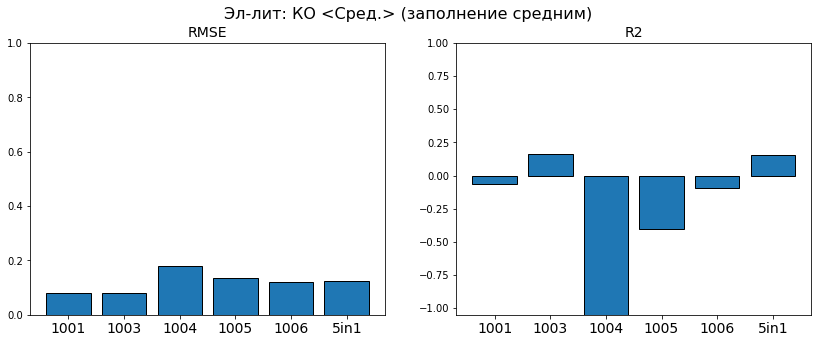

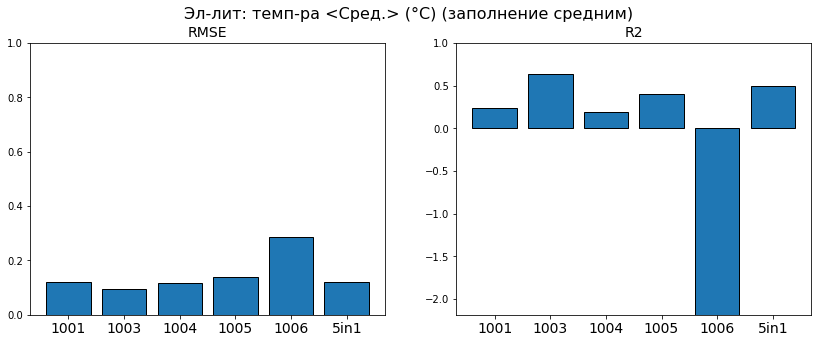

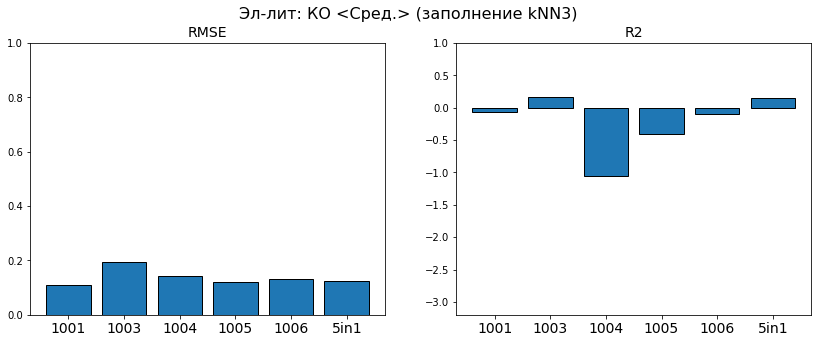

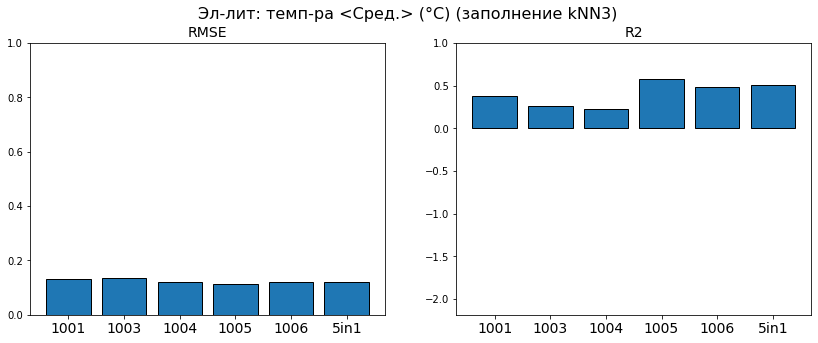

In [25]:
labelsBars=bathNumber[:]
labelsBars.append('5in1')

fig, ax = plt.subplots(ncols=2, figsize=(14,5))
ax[0].bar([0,1,2,3,4,5],rmseLinearMeanEKO, tick_label=labelsBars, ec='black')
ax[0].xaxis.set_tick_params(labelsize=14)
ax[0].set_ylim(0,1)
ax[0].set_title('RMSE', fontsize=14)
ax[1].bar([0,1,2,3,4,5],r2scoreLinearMeanEKO, tick_label=labelsBars, ec='black')
ax[1].xaxis.set_tick_params(labelsize=14)
ax[1].set_ylim(np.min([0, np.min([r2scoreLinearMeanEKO])]),1)
ax[1].set_title('R2', fontsize=14)
fig.suptitle(fullNamesInRussian[paramNames.index('EKO')]+' (заполнение средним)', fontsize=16)
plt.savefig('report_v2/resultsLinRegImpMeanEKO.png', dpi=300, bbox_inches='tight')
plt.show()

fig, ax = plt.subplots(ncols=2, figsize=(14,5))
ax[0].bar([0,1,2,3,4,5],rmseLinearMeanETEMP, tick_label=labelsBars, ec='black')
ax[0].xaxis.set_tick_params(labelsize=14)
ax[0].set_ylim(0,1)
ax[0].set_title('RMSE', fontsize=14)
ax[1].bar([0,1,2,3,4,5],r2scoreLinearMeanETEMP, tick_label=labelsBars, ec='black')
ax[1].xaxis.set_tick_params(labelsize=14)
ax[1].set_ylim(np.min([0, np.min([r2scoreLinearMeanETEMP])]) ,1)
ax[1].set_title('R2', fontsize=14)
fig.suptitle(fullNamesInRussian[paramNames.index('ETEMP')]+' (заполнение средним)', fontsize=16)
plt.savefig('report_v2/resultsLinRegImpMeanETEMP.png', dpi=300, bbox_inches='tight')
plt.show()

fig, ax = plt.subplots(ncols=2, figsize=(14,5))
ax[0].bar([0,1,2,3,4,5],rmseLinearKNN3EKO, tick_label=labelsBars, ec='black')
ax[0].xaxis.set_tick_params(labelsize=14)
ax[0].set_ylim(0,1)
ax[0].set_title('RMSE', fontsize=14)
ax[1].bar([0,1,2,3,4,5],r2scoreLinearMeanEKO, tick_label=labelsBars, ec='black')
ax[1].xaxis.set_tick_params(labelsize=14)
ax[1].set_ylim(np.min([0, np.min([r2scoreLinearKNN3EKO])]),1)
ax[1].set_title('R2', fontsize=14)
fig.suptitle(fullNamesInRussian[paramNames.index('EKO')]+' (заполнение kNN3)', fontsize=16)
plt.savefig('report_v2/resultsLinRegImpKNN3EKO.png', dpi=300, bbox_inches='tight')
plt.show()

fig, ax = plt.subplots(ncols=2, figsize=(14,5))
ax[0].bar([0,1,2,3,4,5],rmseLinearKNN3ETEMP, tick_label=labelsBars, ec='black')
ax[0].xaxis.set_tick_params(labelsize=14)
ax[0].set_ylim(0,1)
ax[0].set_title('RMSE', fontsize=14)
ax[1].bar([0,1,2,3,4,5],r2scoreLinearKNN3ETEMP, tick_label=labelsBars, ec='black')
ax[1].xaxis.set_tick_params(labelsize=14)
ax[1].set_ylim(np.min([0, np.min([r2scoreLinearMeanETEMP])]) ,1)
ax[1].set_title('R2', fontsize=14)
fig.suptitle(fullNamesInRussian[paramNames.index('ETEMP')]+' (заполнение kNN3)', fontsize=16)
plt.savefig('report_v2/resultsLinRegImpKNN3ETEMP.png', dpi=300, bbox_inches='tight')
plt.show()

# метод главных компонент и линейная регрессия

In [26]:
# пример 1001
i=0
dataNoTargets = dataScImpMean[i].drop(columns=['EKO','ETEMP']).values
pcaM=PCA()
newtrain=pcaM.fit_transform(dataNoTargets)

In [27]:
print(np.array_str(pcaM.explained_variance_ratio_*100, precision=2, suppress_small=True))

[20.66 14.04 11.48  6.75  5.84  5.57  5.07  4.88  4.32  3.51  3.37  2.27
  2.    1.81  1.54  1.26  1.21  0.83  0.76  0.74  0.59  0.42  0.31  0.22
  0.18  0.15  0.11  0.06  0.04  0.    0.  ]


In [28]:
i=0
dataNoTargets = dataScImpMean[i].drop(columns=['EKO','ETEMP']).values
pcaM=PCA(n_components=2)
newtrain=pcaM.fit_transform(dataNoTargets)
trainTargetsEKO=dataScImpMean[i]['EKO']
trainTargetsETEMP=dataScImpMean[i]['ETEMP']

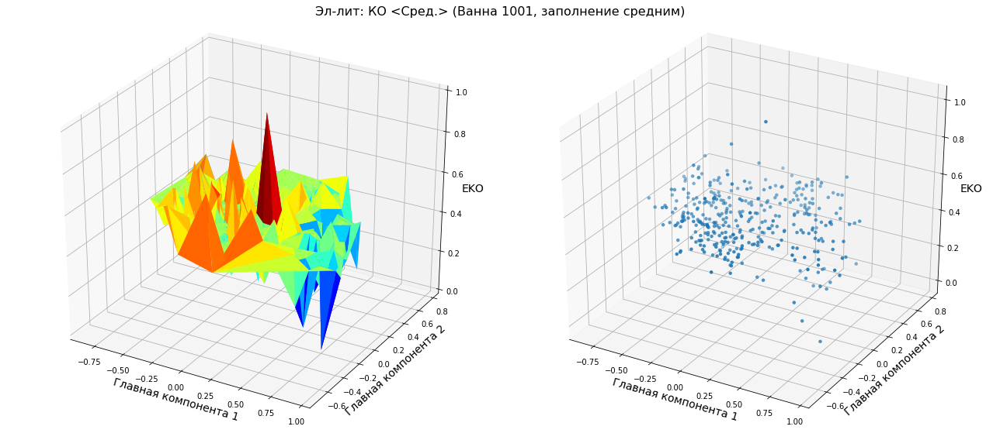

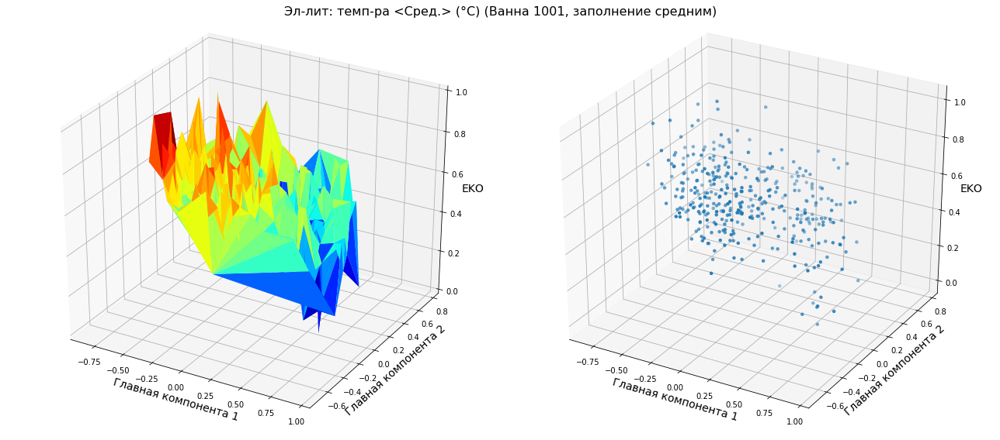

In [29]:
fig = plt.figure(figsize=(18,8))

ax = fig.add_subplot(121, projection='3d')
ax.plot_trisurf(newtrain[:,0],newtrain[:,1],
            trainTargetsEKO, cmap=cm.jet, linewidth=0)
ax.set_xlabel('Главная компонента 1', fontsize=14)
ax.set_ylabel('Главная компонента 2', fontsize=14)
ax.set_zlabel('EKO', fontsize=14)

ax = fig.add_subplot(122, projection='3d')
ax.scatter(newtrain[:,0],newtrain[:,1],
            trainTargetsEKO, cmap=cm.jet, linewidth=0)
ax.set_xlabel('Главная компонента 1', fontsize=14)
ax.set_ylabel('Главная компонента 2', fontsize=14)
ax.set_zlabel('EKO', fontsize=14)

plt.suptitle(fullNamesInRussian[paramNames.index('EKO')]+' (Ванна 1001, заполнение средним)', fontsize=16)
plt.tight_layout()
plt.savefig('report_v2/pca2dImpMeanEKO.png', dpi=300, bbox_inches='tight')
plt.show()


fig = plt.figure(figsize=(18,8))

ax = fig.add_subplot(121, projection='3d')
ax.plot_trisurf(newtrain[:,0],newtrain[:,1],
            trainTargetsETEMP, cmap=cm.jet, linewidth=0)
ax.set_xlabel('Главная компонента 1', fontsize=14)
ax.set_ylabel('Главная компонента 2', fontsize=14)
ax.set_zlabel('EKO', fontsize=14)

ax = fig.add_subplot(122, projection='3d')
ax.scatter(newtrain[:,0],newtrain[:,1],
            trainTargetsETEMP, cmap=cm.jet, linewidth=0)
ax.set_xlabel('Главная компонента 1', fontsize=14)
ax.set_ylabel('Главная компонента 2', fontsize=14)
ax.set_zlabel('EKO', fontsize=14)

plt.suptitle(fullNamesInRussian[paramNames.index('ETEMP')]+' (Ванна 1001, заполнение средним)', fontsize=16)
plt.tight_layout()
plt.savefig('report_v2/pca2dImpMeanETEMP.png', dpi=300, bbox_inches='tight')
plt.show()

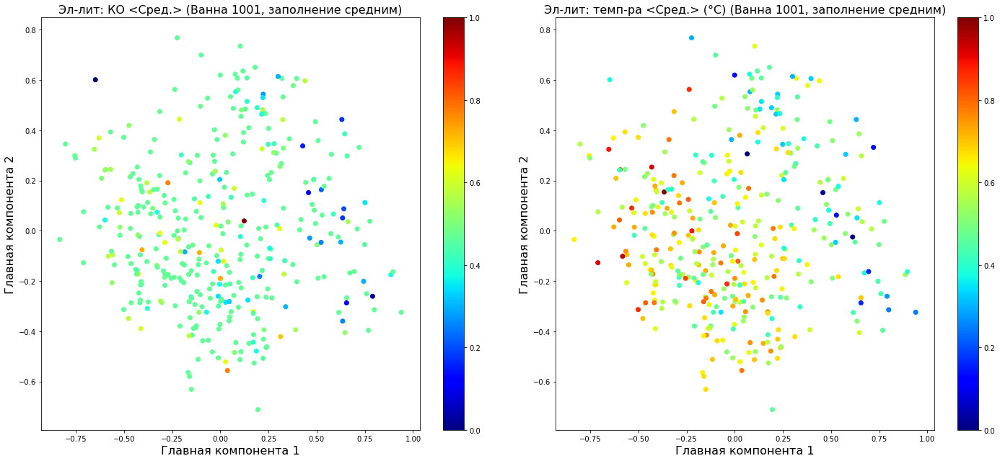

In [30]:
fig, ax = plt.subplots( figsize=(20,9), ncols=2)
ax1=ax[0].scatter(newtrain[:,0],newtrain[:,1], c=trainTargetsEKO, cmap=cm.jet)
ax[0].set_xlabel('Главная компонента 1', fontsize=16)
ax[0].set_ylabel('Главная компонента 2', fontsize=16)
ax2=ax[1].scatter(newtrain[:,0],newtrain[:,1], c=trainTargetsETEMP, cmap=cm.jet)
ax[1].set_xlabel('Главная компонента 1', fontsize=16)
ax[1].set_ylabel('Главная компонента 2', fontsize=16)
ax[0].set_title(fullNamesInRussian[paramNames.index('EKO')]+' (Ванна 1001, заполнение средним)', fontsize=16)
ax[1].set_title(fullNamesInRussian[paramNames.index('ETEMP')]+' (Ванна 1001, заполнение средним)', fontsize=16)
fig.colorbar(ax1, ax=ax[0])
fig.colorbar(ax2, ax=ax[1])
plt.tight_layout()
plt.savefig('report_v2/pca2dPlainImpMeanBOTH.png', dpi=300, bbox_inches='tight')
plt.show()

In [31]:
# пример 1001
i=0
dataNoTargets = dataScImpKNN3[i].drop(columns=['EKO','ETEMP']).values
pcaM=PCA()
newtrain=pcaM.fit_transform(dataNoTargets)

In [32]:
print(np.array_str(pcaM.explained_variance_ratio_*100, precision=2, suppress_small=True))

[24.63 13.85  9.48  8.87  5.71  4.77  4.44  4.18  3.48  3.14  2.72  2.5
  2.05  2.02  1.52  1.31  1.2   1.01  0.7   0.62  0.57  0.35  0.24  0.19
  0.16  0.12  0.09  0.05  0.04  0.    0.  ]


In [33]:
i=0
dataNoTargets = dataScImpKNN3[i].drop(columns=['EKO','ETEMP']).values
pcaM=PCA(n_components=2)
newtrain=pcaM.fit_transform(dataNoTargets)
trainTargetsEKO=dataScImpKNN3[i]['EKO']
trainTargetsETEMP=dataScImpKNN3[i]['ETEMP']

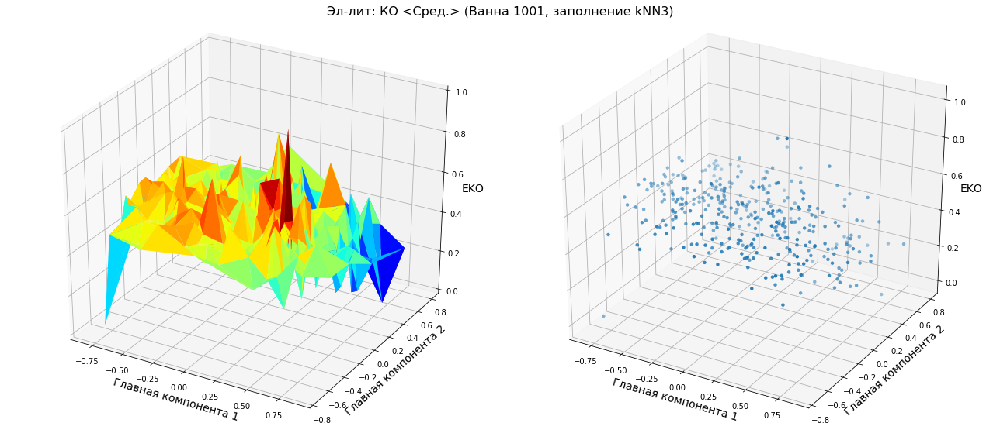

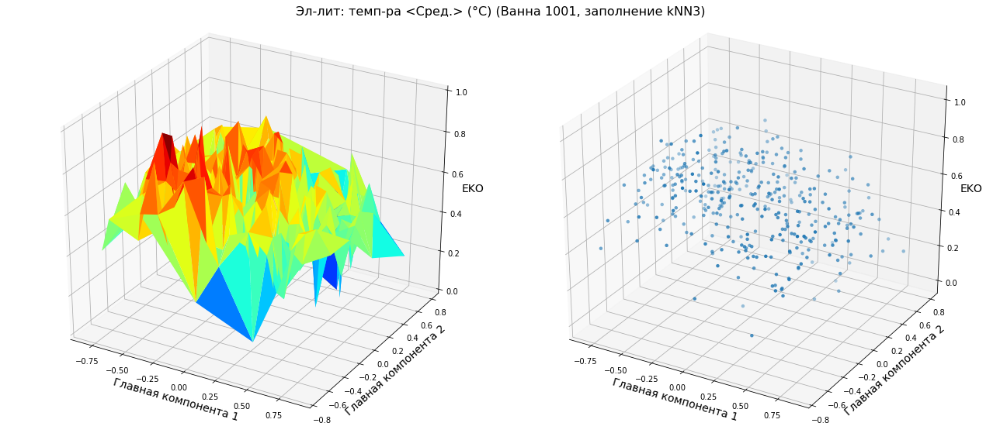

In [34]:
fig = plt.figure(figsize=(18,8))

ax = fig.add_subplot(121, projection='3d')
ax.plot_trisurf(newtrain[:,0],newtrain[:,1],
            trainTargetsEKO, cmap=cm.jet, linewidth=0)
ax.set_xlabel('Главная компонента 1', fontsize=14)
ax.set_ylabel('Главная компонента 2', fontsize=14)
ax.set_zlabel('EKO', fontsize=14)

ax = fig.add_subplot(122, projection='3d')
ax.scatter(newtrain[:,0],newtrain[:,1],
            trainTargetsEKO, cmap=cm.jet, linewidth=0)
ax.set_xlabel('Главная компонента 1', fontsize=14)
ax.set_ylabel('Главная компонента 2', fontsize=14)
ax.set_zlabel('EKO', fontsize=14)

plt.suptitle(fullNamesInRussian[paramNames.index('EKO')]+' (Ванна 1001, заполнение kNN3)', fontsize=16)
plt.tight_layout()
plt.savefig('report_v2/pca2dImpKNN3EKO.png', dpi=300, bbox_inches='tight')
plt.show()


fig = plt.figure(figsize=(18,8))

ax = fig.add_subplot(121, projection='3d')
ax.plot_trisurf(newtrain[:,0],newtrain[:,1],
            trainTargetsETEMP, cmap=cm.jet, linewidth=0)
ax.set_xlabel('Главная компонента 1', fontsize=14)
ax.set_ylabel('Главная компонента 2', fontsize=14)
ax.set_zlabel('EKO', fontsize=14)

ax = fig.add_subplot(122, projection='3d')
ax.scatter(newtrain[:,0],newtrain[:,1],
            trainTargetsETEMP, cmap=cm.jet, linewidth=0)
ax.set_xlabel('Главная компонента 1', fontsize=14)
ax.set_ylabel('Главная компонента 2', fontsize=14)
ax.set_zlabel('EKO', fontsize=14)

plt.suptitle(fullNamesInRussian[paramNames.index('ETEMP')]+' (Ванна 1001, заполнение kNN3)', fontsize=16)
plt.tight_layout()
plt.savefig('report_v2/pca2dImpMKNN3ETEMP.png', dpi=300, bbox_inches='tight')
plt.show()

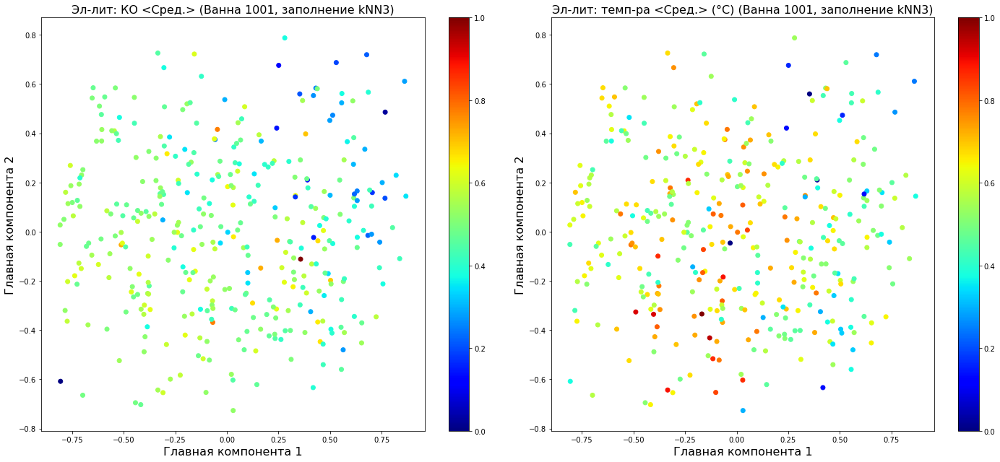

In [35]:
fig, ax = plt.subplots( figsize=(20,9), ncols=2)
ax1=ax[0].scatter(newtrain[:,0],newtrain[:,1], c=trainTargetsEKO, cmap=cm.jet)
ax[0].set_xlabel('Главная компонента 1', fontsize=16)
ax[0].set_ylabel('Главная компонента 2', fontsize=16)
ax2=ax[1].scatter(newtrain[:,0],newtrain[:,1], c=trainTargetsETEMP, cmap=cm.jet)
ax[1].set_xlabel('Главная компонента 1', fontsize=16)
ax[1].set_ylabel('Главная компонента 2', fontsize=16)
ax[0].set_title(fullNamesInRussian[paramNames.index('EKO')]+' (Ванна 1001, заполнение kNN3)', fontsize=16)
ax[1].set_title(fullNamesInRussian[paramNames.index('ETEMP')]+' (Ванна 1001, заполнение kNN3)', fontsize=16)
fig.colorbar(ax1, ax=ax[0])
fig.colorbar(ax2, ax=ax[1])
plt.tight_layout()
plt.savefig('report_v2/pca2dPlainImpKNN3BOTH.png', dpi=300, bbox_inches='tight')
plt.show()

### тоже самое с 5-в-1

In [36]:
# пример 5-в-1
pcaM=PCA()
newtrain=pcaM.fit_transform(data5ni1Mean.drop(columns=['EKO','ETEMP']).values)

print(np.array_str(pcaM.explained_variance_ratio_*100, precision=2, suppress_small=True))

[17.18 12.44 10.17  8.78  7.26  5.81  4.74  4.01  3.27  3.09  3.04  2.36
  2.25  2.07  1.99  1.92  1.71  1.4   1.25  1.21  0.92  0.76  0.64  0.51
  0.31  0.28  0.23  0.17  0.14  0.1   0.  ]


In [37]:
# пример 5-в-1
pcaM=PCA(n_components=2)
newtrain=pcaM.fit_transform(data5ni1Mean.drop(columns=['EKO','ETEMP']).values)
trainTargetsEKO=data5ni1Mean['EKO']
trainTargetsETEMP=data5ni1Mean['ETEMP']

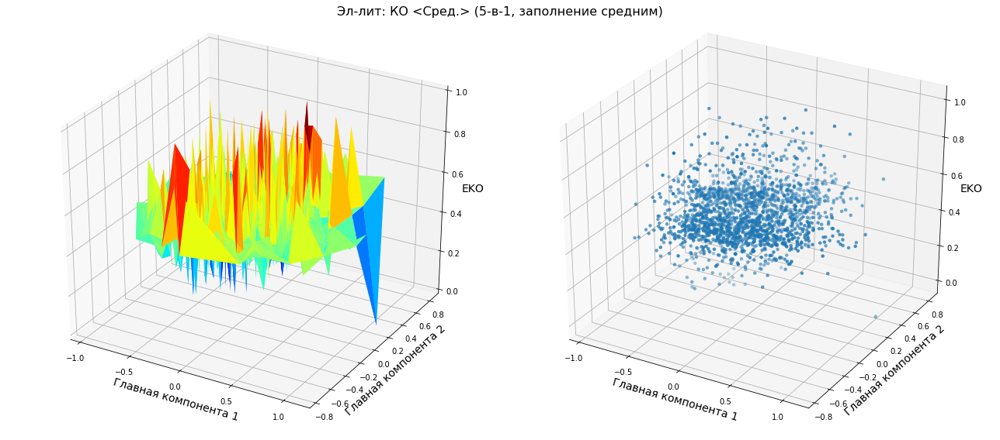

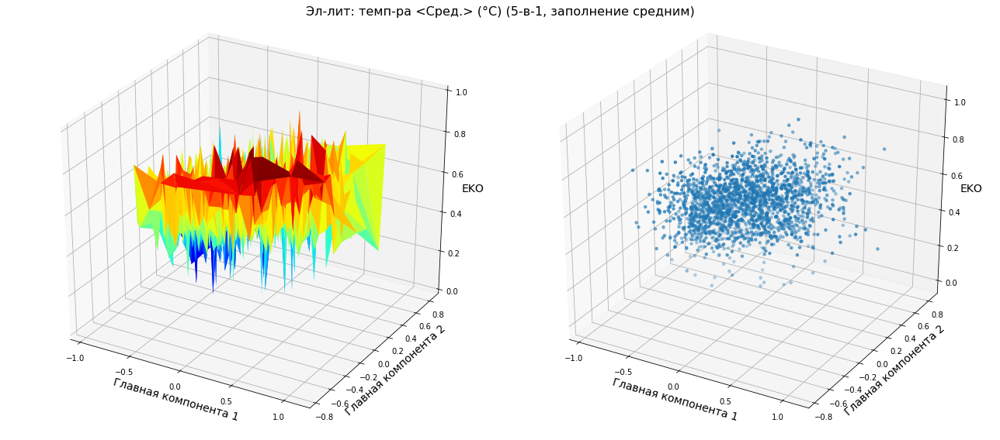

In [38]:
fig = plt.figure(figsize=(18,8))

ax = fig.add_subplot(121, projection='3d')
ax.plot_trisurf(newtrain[:,0],newtrain[:,1],
            trainTargetsEKO, cmap=cm.jet, linewidth=0)
ax.set_xlabel('Главная компонента 1', fontsize=14)
ax.set_ylabel('Главная компонента 2', fontsize=14)
ax.set_zlabel('EKO', fontsize=14)

ax = fig.add_subplot(122, projection='3d')
ax.scatter(newtrain[:,0],newtrain[:,1],
            trainTargetsEKO, cmap=cm.jet, linewidth=0)
ax.set_xlabel('Главная компонента 1', fontsize=14)
ax.set_ylabel('Главная компонента 2', fontsize=14)
ax.set_zlabel('EKO', fontsize=14)

plt.suptitle(fullNamesInRussian[paramNames.index('EKO')]+' (5-в-1, заполнение средним)', fontsize=16)
plt.tight_layout()
plt.savefig('report_v2/pca2d5in1ImpMeanEKO.png', dpi=300, bbox_inches='tight')
plt.show()


fig = plt.figure(figsize=(18,8))

ax = fig.add_subplot(121, projection='3d')
ax.plot_trisurf(newtrain[:,0],newtrain[:,1],
            trainTargetsETEMP, cmap=cm.jet, linewidth=0)
ax.set_xlabel('Главная компонента 1', fontsize=14)
ax.set_ylabel('Главная компонента 2', fontsize=14)
ax.set_zlabel('EKO', fontsize=14)

ax = fig.add_subplot(122, projection='3d')
ax.scatter(newtrain[:,0],newtrain[:,1],
            trainTargetsETEMP, cmap=cm.jet, linewidth=0)
ax.set_xlabel('Главная компонента 1', fontsize=14)
ax.set_ylabel('Главная компонента 2', fontsize=14)
ax.set_zlabel('EKO', fontsize=14)

plt.suptitle(fullNamesInRussian[paramNames.index('ETEMP')]+' (5-в-1, заполнение средним)', fontsize=16)
plt.tight_layout()
plt.savefig('report_v2/pca2d5in1ImpMeanETEMP.png', dpi=300, bbox_inches='tight')
plt.show()

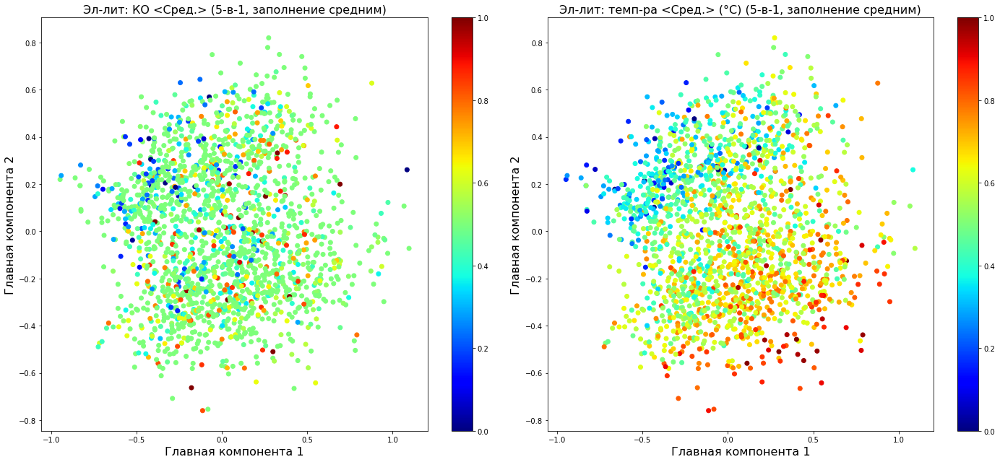

In [39]:
fig, ax = plt.subplots( figsize=(20,9), ncols=2)
ax1=ax[0].scatter(newtrain[:,0],newtrain[:,1], c=trainTargetsEKO, cmap=cm.jet)
ax[0].set_xlabel('Главная компонента 1', fontsize=16)
ax[0].set_ylabel('Главная компонента 2', fontsize=16)
ax2=ax[1].scatter(newtrain[:,0],newtrain[:,1], c=trainTargetsETEMP, cmap=cm.jet)
ax[1].set_xlabel('Главная компонента 1', fontsize=16)
ax[1].set_ylabel('Главная компонента 2', fontsize=16)
ax[0].set_title(fullNamesInRussian[paramNames.index('EKO')]+' (5-в-1, заполнение средним)', fontsize=16)
ax[1].set_title(fullNamesInRussian[paramNames.index('ETEMP')]+' (5-в-1, заполнение средним)', fontsize=16)
fig.colorbar(ax1, ax=ax[0])
fig.colorbar(ax2, ax=ax[1])
plt.tight_layout()
plt.savefig('report_v2/pca2d5in1PlainImpMeanBOTH.png', dpi=300, bbox_inches='tight')
plt.show()

In [40]:
# пример 5-в-1
pcaM=PCA()
newtrain=pcaM.fit_transform(data5ni1KNN3.drop(columns=['EKO','ETEMP']).values)

print(np.array_str(pcaM.explained_variance_ratio_*100, precision=2, suppress_small=True))

[16.38 11.9  10.59  8.21  8.04  5.69  4.91  4.17  3.7   3.19  3.02  2.68
  2.39  2.16  1.91  1.84  1.65  1.5   1.16  1.06  0.89  0.61  0.56  0.51
  0.46  0.26  0.21  0.15  0.13  0.09  0.  ]


In [41]:
# пример 5-в-1
pcaM=PCA(n_components=2)
newtrain=pcaM.fit_transform(data5ni1KNN3.drop(columns=['EKO','ETEMP']).values)
trainTargetsEKO=data5ni1KNN3['EKO']
trainTargetsETEMP=data5ni1KNN3['ETEMP']

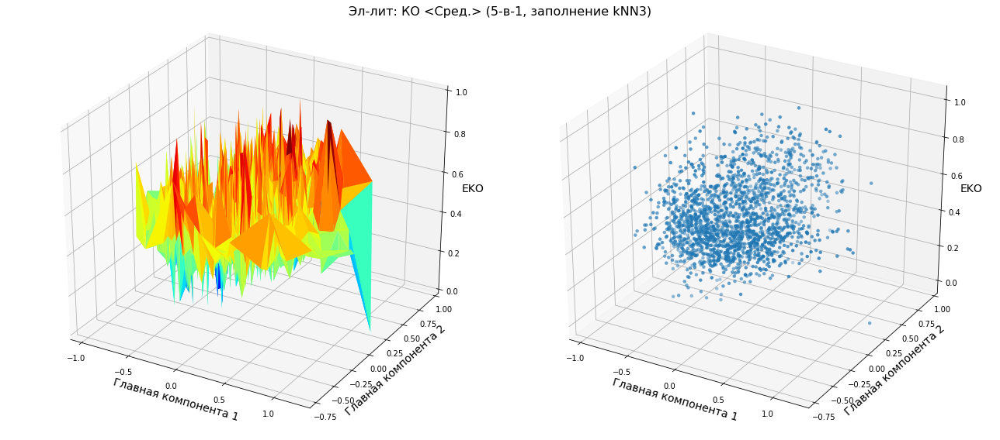

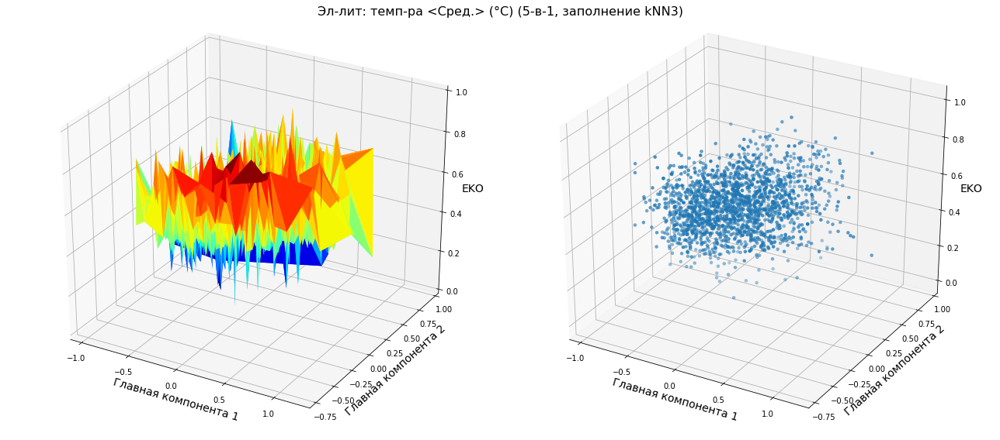

In [42]:
fig = plt.figure(figsize=(18,8))

ax = fig.add_subplot(121, projection='3d')
ax.plot_trisurf(newtrain[:,0],newtrain[:,1],
            trainTargetsEKO, cmap=cm.jet, linewidth=0)
ax.set_xlabel('Главная компонента 1', fontsize=14)
ax.set_ylabel('Главная компонента 2', fontsize=14)
ax.set_zlabel('EKO', fontsize=14)

ax = fig.add_subplot(122, projection='3d')
ax.scatter(newtrain[:,0],newtrain[:,1],
            trainTargetsEKO, cmap=cm.jet, linewidth=0)
ax.set_xlabel('Главная компонента 1', fontsize=14)
ax.set_ylabel('Главная компонента 2', fontsize=14)
ax.set_zlabel('EKO', fontsize=14)

plt.suptitle(fullNamesInRussian[paramNames.index('EKO')]+' (5-в-1, заполнение kNN3)', fontsize=16)
plt.tight_layout()
plt.savefig('report_v2/pca2d5in1ImpKNN3EKO.png', dpi=300, bbox_inches='tight')
plt.show()


fig = plt.figure(figsize=(18,8))

ax = fig.add_subplot(121, projection='3d')
ax.plot_trisurf(newtrain[:,0],newtrain[:,1],
            trainTargetsETEMP, cmap=cm.jet, linewidth=0)
ax.set_xlabel('Главная компонента 1', fontsize=14)
ax.set_ylabel('Главная компонента 2', fontsize=14)
ax.set_zlabel('EKO', fontsize=14)

ax = fig.add_subplot(122, projection='3d')
ax.scatter(newtrain[:,0],newtrain[:,1],
            trainTargetsETEMP, cmap=cm.jet, linewidth=0)
ax.set_xlabel('Главная компонента 1', fontsize=14)
ax.set_ylabel('Главная компонента 2', fontsize=14)
ax.set_zlabel('EKO', fontsize=14)

plt.suptitle(fullNamesInRussian[paramNames.index('ETEMP')]+' (5-в-1, заполнение kNN3)', fontsize=16)
plt.tight_layout()
plt.savefig('report_v2/pca2d5in1ImpKNN3ETEMP.png', dpi=300, bbox_inches='tight')
plt.show()

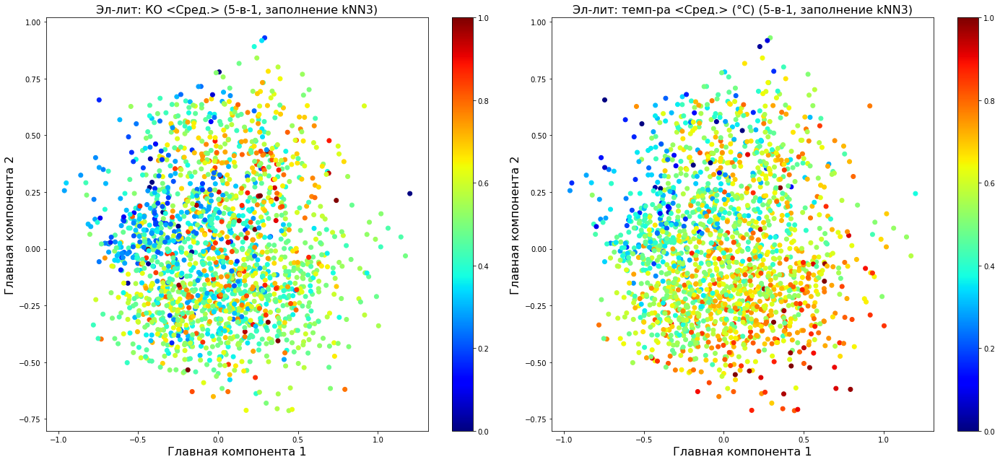

In [43]:
fig, ax = plt.subplots( figsize=(20,9), ncols=2)
ax1=ax[0].scatter(newtrain[:,0],newtrain[:,1], c=trainTargetsEKO, cmap=cm.jet)
ax[0].set_xlabel('Главная компонента 1', fontsize=16)
ax[0].set_ylabel('Главная компонента 2', fontsize=16)
ax2=ax[1].scatter(newtrain[:,0],newtrain[:,1], c=trainTargetsETEMP, cmap=cm.jet)
ax[1].set_xlabel('Главная компонента 1', fontsize=16)
ax[1].set_ylabel('Главная компонента 2', fontsize=16)
ax[0].set_title(fullNamesInRussian[paramNames.index('EKO')]+' (5-в-1, заполнение kNN3)', fontsize=16)
ax[1].set_title(fullNamesInRussian[paramNames.index('ETEMP')]+' (5-в-1, заполнение kNN3)', fontsize=16)
fig.colorbar(ax1, ax=ax[0])
fig.colorbar(ax2, ax=ax[1])
plt.tight_layout()
plt.savefig('report_v2/pca2d5in1PlainImpKNN3BOTH.png', dpi=300, bbox_inches='tight')
plt.show()

## линейная модель c PCA

In [44]:
def gridSerchPCALinearModel(n):

    pcaDataScImpMean=[None]*5
    pcaDataScImpKNN3=[None]*5
    for i in range(5):
        pcaModel=PCA(n_components=n)
        pcaDataScImpMean[i]=pcaModel.fit_transform(dataScImpMean[i].drop(columns=['EKO','ETEMP']))
        pcaDataScImpMean[i]=pd.DataFrame(pcaDataScImpMean[i])
        pcaDataScImpMean[i]['EKO']=dataScImpMean[i]['EKO'].copy()
        pcaDataScImpMean[i]['ETEMP']=dataScImpMean[i]['ETEMP'].copy()
        pcaModel=PCA(n_components=n)
        pcaDataScImpKNN3[i]=pcaModel.fit_transform(dataScImpKNN3[i].drop(columns=['EKO','ETEMP']))
        pcaDataScImpKNN3[i]=pd.DataFrame(pcaDataScImpKNN3[i])
        pcaDataScImpKNN3[i]['EKO']=dataScImpKNN3[i]['EKO'].copy()
        pcaDataScImpKNN3[i]['ETEMP']=dataScImpKNN3[i]['ETEMP'].copy()        
    
    pcaModel=PCA(n_components=n)
    pcaData5in1ScImpMean=pcaModel.fit_transform(data5ni1Mean.drop(columns=['EKO','ETEMP']))
    pcaData5in1ScImpMean=pd.DataFrame(pcaData5in1ScImpMean)
    pcaData5in1ScImpMean['EKO']=data5ni1Mean['EKO'].copy()
    pcaData5in1ScImpMean['ETEMP']=data5ni1Mean['ETEMP'].copy()
    pcaModel=PCA(n_components=n)
    pcaData5in1ScImpKNN3=pcaModel.fit_transform(data5ni1KNN3.drop(columns=['EKO','ETEMP']))
    pcaData5in1ScImpKNN3=pd.DataFrame(pcaData5in1ScImpKNN3)
    pcaData5in1ScImpKNN3['EKO']=data5ni1KNN3['EKO'].copy()
    pcaData5in1ScImpKNN3['ETEMP']=data5ni1KNN3['ETEMP'].copy()


    trainPCAImpMean=[None]*5
    testPCAImpMean=[None]*5
    for i in range(5):
        trainPCAImpMean[i], testPCAImpMean[i] = train_test_split(pcaDataScImpMean[i], test_size=0.25)
    trainPCA5in1ImpMean, testPCA5in1ImpMean = train_test_split(pcaData5in1ScImpMean, test_size=0.25)
    trainPCAImpKNN3=[None]*5
    testPCAImpKNN3=[None]*5
    for i in range(5):
        trainPCAImpKNN3[i], testPCAImpKNN3[i] = train_test_split(pcaDataScImpKNN3[i], test_size=0.25)
    trainPCA5in1ImpKNN3, testPCA5in1ImpKNN3 = train_test_split(pcaData5in1ScImpKNN3, test_size=0.25)


    modelPCALinearMeanEKO=[None]*6
    rmsePCALinearMeanEKO=[None]*6
    r2scorePCALinearMeanEKO=[None]*6

    modelPCALinearMeanETEMP=[None]*6
    rmsePCALinearMeanETEMP=[None]*6
    r2scorePCALinearMeanETEMP=[None]*6

    modelPCALinearKNN3EKO=[None]*6
    rmsePCALinearKNN3EKO=[None]*6
    r2scorePCALinearKNN3EKO=[None]*6

    modelPCALinearKNN3ETEMP=[None]*6
    rmsePCALinearKNN3ETEMP=[None]*6
    r2scorePCALinearKNN3ETEMP=[None]*6


    for i in range(5):
        
        # среднее
        # по параметру EKO по ваннам
        trainInputsEKO = trainPCAImpMean[i].drop(columns=['EKO','ETEMP']).values
        testInputsEKO = testPCAImpMean[i].drop(columns=['EKO','ETEMP']).values
        trainTargetsEKO = trainPCAImpMean[i]['EKO'].values
        testTargetsEKO = testPCAImpMean[i]['EKO'].values
        
        modelPCALinearMeanEKO[i] = LinearRegression()
        modelPCALinearMeanEKO[i].fit(trainInputsEKO,trainTargetsEKO)
        predictedEKO = modelPCALinearMeanEKO[i].predict(testInputsEKO)
        
        rmsePCALinearMeanEKO[i] = mean_squared_error(testTargetsEKO, predictedEKO, squared=False)
        r2scorePCALinearMeanEKO[i] = r2_score(testTargetsEKO, predictedEKO)

        # knn3
        # по параметру EKO по ваннам
        trainInputsEKO = trainPCAImpKNN3[i].drop(columns=['EKO','ETEMP']).values
        testInputsEKO = testPCAImpKNN3[i].drop(columns=['EKO','ETEMP']).values
        trainTargetsEKO = trainPCAImpKNN3[i]['EKO'].values
        testTargetsEKO = testPCAImpKNN3[i]['EKO'].values
        
        modelPCALinearKNN3EKO[i] = LinearRegression()
        modelPCALinearKNN3EKO[i].fit(trainInputsEKO,trainTargetsEKO)
        predictedEKO = modelPCALinearKNN3EKO[i].predict(testInputsEKO)
        
        rmsePCALinearKNN3EKO[i] = mean_squared_error(testTargetsEKO, predictedEKO, squared=False)
        r2scorePCALinearKNN3EKO[i] = r2_score(testTargetsEKO, predictedEKO)

        # среднее
        # по параметру ETEMP по ваннам
        trainInputsETEMP = trainPCAImpMean[i].drop(columns=['EKO','ETEMP']).values
        testInputsETEMP = testPCAImpMean[i].drop(columns=['EKO','ETEMP']).values
        trainTargetsETEMP = trainPCAImpMean[i]['ETEMP'].values
        testTargetsETEMP = testPCAImpMean[i]['ETEMP'].values
        
        modelPCALinearMeanETEMP[i] = LinearRegression()
        modelPCALinearMeanETEMP[i].fit(trainInputsETEMP,trainTargetsETEMP)
        predictedETEMP = modelPCALinearMeanETEMP[i].predict(testInputsETEMP)
        
        rmsePCALinearMeanETEMP[i] = mean_squared_error(testTargetsETEMP, predictedETEMP, squared=False)
        r2scorePCALinearMeanETEMP[i] = r2_score(testTargetsETEMP, predictedETEMP)

        # knn3
        # по параметру ETEMP по ваннам
        trainInputsETEMP = trainPCAImpKNN3[i].drop(columns=['EKO','ETEMP']).values
        testInputsETEMP = testPCAImpKNN3[i].drop(columns=['EKO','ETEMP']).values
        trainTargetsETEMP = trainPCAImpKNN3[i]['ETEMP'].values
        testTargetsETEMP = testPCAImpKNN3[i]['ETEMP'].values
        
        modelPCALinearKNN3ETEMP[i] = LinearRegression()
        modelPCALinearKNN3ETEMP[i].fit(trainInputsETEMP,trainTargetsETEMP)
        predictedETEMP = modelPCALinearKNN3ETEMP[i].predict(testInputsETEMP)
        
        rmsePCALinearKNN3ETEMP[i] = mean_squared_error(testTargetsETEMP, predictedETEMP, squared=False)
        r2scorePCALinearKNN3ETEMP[i] = r2_score(testTargetsETEMP, predictedETEMP)

    
    # среднее
    # по параметру EKO 5-в-1
    trainInputs5in1EKO = trainPCA5in1ImpMean.drop(columns=['EKO','ETEMP']).values
    testInputs5in1EKO = testPCA5in1ImpMean.drop(columns=['EKO','ETEMP']).values
    trainTargets5in1EKO = trainPCA5in1ImpMean['EKO'].values
    testTargets5in1EKO = testPCA5in1ImpMean['EKO'].values

    modelPCALinearMeanEKO[5] = LinearRegression()
    modelPCALinearMeanEKO[5].fit(trainInputs5in1EKO, trainTargets5in1EKO)
    predictedEKO = modelPCALinearMeanEKO[5].predict(testInputs5in1EKO)

    rmsePCALinearMeanEKO[5] = mean_squared_error(testTargets5in1EKO, predictedEKO, squared=False)
    r2scorePCALinearMeanEKO[5] = r2_score(testTargets5in1EKO, predictedEKO)

    # knn3
    # по параметру EKO 5-в-1
    trainInputs5in1EKO = trainPCA5in1ImpKNN3.drop(columns=['EKO','ETEMP']).values
    testInputs5in1EKO = testPCA5in1ImpKNN3.drop(columns=['EKO','ETEMP']).values
    trainTargets5in1EKO = trainPCA5in1ImpKNN3['EKO'].values
    testTargets5in1EKO = testPCA5in1ImpKNN3['EKO'].values

    modelPCALinearKNN3EKO[5] = LinearRegression()
    modelPCALinearKNN3EKO[5].fit(trainInputs5in1EKO, trainTargets5in1EKO)
    predictedEKO = modelPCALinearKNN3EKO[5].predict(testInputs5in1EKO)

    rmsePCALinearKNN3EKO[5] = mean_squared_error(testTargets5in1EKO, predictedEKO, squared=False)
    r2scorePCALinearKNN3EKO[5] = r2_score(testTargets5in1EKO, predictedEKO)

    # среднее
    # по параметру ETEMP 5-в-1
    trainInputs5in1ETEMP = trainPCA5in1ImpMean.drop(columns=['EKO','ETEMP']).values
    testInputs5in1ETEMP = testPCA5in1ImpMean.drop(columns=['EKO','ETEMP']).values
    trainTargets5in1ETEMP = trainPCA5in1ImpMean['ETEMP'].values
    testTargets5in1ETEMP = testPCA5in1ImpMean['ETEMP'].values

    modelPCALinearMeanETEMP[5] = LinearRegression()
    modelPCALinearMeanETEMP[5].fit(trainInputs5in1ETEMP, trainTargets5in1ETEMP)
    predictedETEMP = modelPCALinearMeanETEMP[5].predict(testInputs5in1ETEMP)

    rmsePCALinearMeanETEMP[5] = mean_squared_error(testTargets5in1ETEMP, predictedETEMP, squared=False)
    r2scorePCALinearMeanETEMP[5] = r2_score(testTargets5in1ETEMP, predictedETEMP)

    # knn3
    # по параметру ETEMP 5-в-1
    trainInputs5in1ETEMP = trainPCA5in1ImpKNN3.drop(columns=['EKO','ETEMP']).values
    testInputs5in1ETEMP = testPCA5in1ImpKNN3.drop(columns=['EKO','ETEMP']).values
    trainTargets5in1ETEMP = trainPCA5in1ImpKNN3['ETEMP'].values
    testTargets5in1ETEMP = testPCA5in1ImpKNN3['ETEMP'].values

    modelPCALinearKNN3ETEMP[5] = LinearRegression()
    modelPCALinearKNN3ETEMP[5].fit(trainInputs5in1ETEMP, trainTargets5in1ETEMP)
    predictedETEMP = modelPCALinearKNN3ETEMP[5].predict(testInputs5in1ETEMP)

    rmsePCALinearKNN3ETEMP[5] = mean_squared_error(testTargets5in1ETEMP, predictedETEMP, squared=False)
    r2scorePCALinearKNN3ETEMP[5] = r2_score(testTargets5in1ETEMP, predictedETEMP)


    return rmsePCALinearMeanEKO, r2scorePCALinearMeanEKO, rmsePCALinearMeanETEMP, r2scorePCALinearMeanETEMP, rmsePCALinearKNN3EKO, r2scorePCALinearKNN3EKO, rmsePCALinearKNN3ETEMP, r2scorePCALinearKNN3ETEMP, 

In [45]:
maxNumCompPCA=len(dataScImpMean[0].columns)
rezMeanEKO_MSE=[]
rezMeanEKO_R2=[]
rezMeanETEMP_MSE=[]
rezMeanETEMP_R2=[]
rezKNN3EKO_MSE=[]
rezKNN3EKO_R2=[]
rezKNN3ETEMP_MSE=[]
rezKNN3ETEMP_R2=[]

for i in range(maxNumCompPCA-1-2):
    _mse1, _r21, _mse2, _r22, __mse1, __r21, __mse2, __r22= gridSerchPCALinearModel(i+1)
    rezMeanEKO_MSE.append(_mse1)
    rezMeanEKO_R2.append(_r21)
    rezMeanETEMP_MSE.append(_mse2)
    rezMeanETEMP_R2.append(_r22)
    rezKNN3EKO_MSE.append(__mse1)
    rezKNN3EKO_R2.append(__r21)
    rezKNN3ETEMP_MSE.append(__mse2)
    rezKNN3ETEMP_R2.append(__r22)        

In [46]:
a=np.array(rezMeanEKO_MSE)
b=a.max(axis=0)
print(b)
c=a.argmax(axis=0)
print(c+1)

[0.14036928 0.15221012 0.17829217 0.16167544 0.14792479 0.12744319]
[21 30 29 29 29  8]


In [47]:
rezEKOGridPCA=pd.DataFrame( 
        {
            'maxRMSE_mean': np.array(rezMeanEKO_MSE).min(axis=0), 
            'nPCA_RMSE_mean': np.array(rezMeanEKO_MSE).argmin(axis=0)+1,
            'maxR2_mean': np.array(rezMeanEKO_R2).max(axis=0),
            'nPCA_R2_mean': np.array(rezMeanEKO_R2).argmax(axis=0)+1,
            'maxRMSE_kNN3': np.array(rezKNN3EKO_MSE).min(axis=0), 
            'nPCA_RMSE_kNN3': np.array(rezKNN3EKO_MSE).argmin(axis=0)+1,
            'maxR2_kNN3': np.array(rezKNN3EKO_R2).max(axis=0),
            'nPCA_R2_kNN3': np.array(rezKNN3EKO_R2).argmax(axis=0)+1
        },
        index=['1001','1003','1004','1005','1006', '5in1']
    )
rezEKOGridPCA

,maxRMSE_mean,nPCA_RMSE_mean,maxR2_mean,nPCA_R2_mean,maxRMSE_kNN3,nPCA_RMSE_kNN3,maxR2_kNN3,nPCA_R2_kNN3
1001,0.062300,6,0.101053,2,0.079666,20,0.440814,23
1003,0.067783,7,0.337045,24,0.065080,14,0.633440,14
1004,0.107769,21,0.244389,21,0.113724,20,0.541798,20
1005,0.090406,9,0.198011,15,0.100297,17,0.650671,16
1006,0.089758,16,0.211802,11,0.105860,11,0.504881,29
5in1,0.106832,26,0.203819,26,0.120232,30,0.481733,30


In [48]:
rezETEMPGridPCA=pd.DataFrame( 
        {
            'maxRMSE_mean': np.array(rezMeanETEMP_MSE).min(axis=0), 
            'nPCA_RMSE_mean': np.array(rezMeanETEMP_MSE).argmin(axis=0)+1,
            'maxR2_mean': np.array(rezMeanETEMP_R2).max(axis=0),
            'nPCA_R2_mean': np.array(rezMeanETEMP_R2).argmax(axis=0)+1,
            'maxRMSE_kNN3': np.array(rezKNN3ETEMP_MSE).min(axis=0), 
            'nPCA_RMSE_kNN3': np.array(rezKNN3ETEMP_MSE).argmin(axis=0)+1,
            'maxR2_kNN3': np.array(rezKNN3ETEMP_R2).max(axis=0),
            'nPCA_R2_kNN3': np.array(rezKNN3ETEMP_R2).argmax(axis=0)+1
        },
        index=['1001','1003','1004','1005','1006', '5in1']
    )
rezETEMPGridPCA

,maxRMSE_mean,nPCA_RMSE_mean,maxR2_mean,nPCA_R2_mean,maxRMSE_kNN3,nPCA_RMSE_kNN3,maxR2_kNN3,nPCA_R2_kNN3
1001,0.110874,27,0.442935,22,0.098590,24,0.578266,19
1003,0.096628,3,0.692474,10,0.090197,25,0.671317,4
1004,0.108212,27,0.452687,17,0.112040,18,0.421652,17
1005,0.103348,12,0.659494,12,0.103283,29,0.653194,29
1006,0.097915,6,0.618780,27,0.101804,29,0.592071,26
5in1,0.116901,27,0.474045,30,0.113721,26,0.497355,30


In [49]:
# сохраним в excel
writer = pd.ExcelWriter('report_v2\\rezPCAgridLinear.xlsx', engine='xlsxwriter')
rezEKOGridPCA.to_excel(writer, sheet_name='Эл-лит КО cред.')
rezETEMPGridPCA.to_excel(writer, sheet_name='Эл-лит темп-ра cред.')
writer.save()

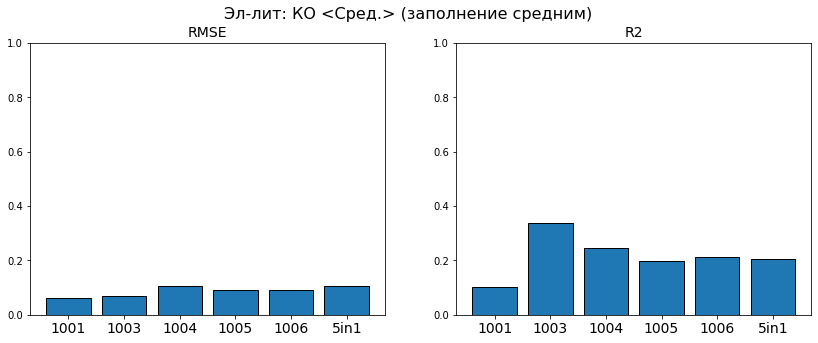

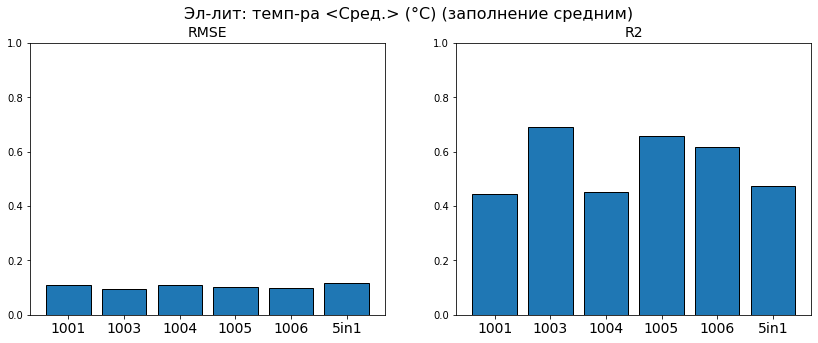

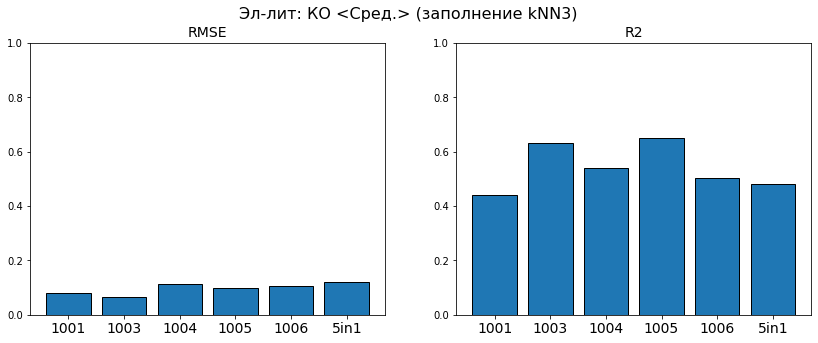

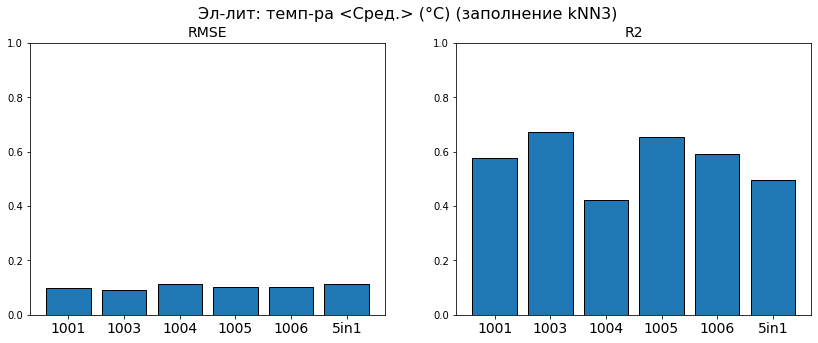

In [50]:
labelsBars=bathNumber[:]
labelsBars.append('5in1')

fig, ax = plt.subplots(ncols=2, figsize=(14,5))
ax[0].bar([0,1,2,3,4,5],rezEKOGridPCA['maxRMSE_mean'], tick_label=labelsBars, ec='black')
ax[0].xaxis.set_tick_params(labelsize=14)
ax[0].set_ylim(0,1)
ax[0].set_title('RMSE', fontsize=14)
ax[1].bar([0,1,2,3,4,5],rezEKOGridPCA['maxR2_mean'], tick_label=labelsBars, ec='black')
ax[1].xaxis.set_tick_params(labelsize=14)
ax[1].set_ylim(np.min([0, np.min(rezEKOGridPCA['maxR2_mean'])]),1)
ax[1].set_title('R2', fontsize=14)
fig.suptitle(fullNamesInRussian[paramNames.index('EKO')]+' (заполнение средним)', fontsize=16)
plt.savefig('report_v2/resultsLinPCAImpMeanEKO.png', dpi=300, bbox_inches='tight')
plt.show()

fig, ax = plt.subplots(ncols=2, figsize=(14,5))
ax[0].bar([0,1,2,3,4,5],rezETEMPGridPCA['maxRMSE_mean'], tick_label=labelsBars, ec='black')
ax[0].xaxis.set_tick_params(labelsize=14)
ax[0].set_ylim(0,1)
ax[0].set_title('RMSE', fontsize=14)
ax[1].bar([0,1,2,3,4,5],rezETEMPGridPCA['maxR2_mean'], tick_label=labelsBars, ec='black')
ax[1].xaxis.set_tick_params(labelsize=14)
ax[1].set_ylim(np.min([0, np.min(rezETEMPGridPCA['maxR2_mean'])]) ,1)
ax[1].set_title('R2', fontsize=14)
fig.suptitle(fullNamesInRussian[paramNames.index('ETEMP')]+' (заполнение средним)', fontsize=16)
plt.savefig('report_v2/resultsLinPCAImpMeanETEMP.png', dpi=300, bbox_inches='tight')
plt.show()

fig, ax = plt.subplots(ncols=2, figsize=(14,5))
ax[0].bar([0,1,2,3,4,5],rezEKOGridPCA['maxRMSE_kNN3'], tick_label=labelsBars, ec='black')
ax[0].xaxis.set_tick_params(labelsize=14)
ax[0].set_ylim(0,1)
ax[0].set_title('RMSE', fontsize=14)
ax[1].bar([0,1,2,3,4,5],rezEKOGridPCA['maxR2_kNN3'], tick_label=labelsBars, ec='black')
ax[1].xaxis.set_tick_params(labelsize=14)
ax[1].set_ylim(np.min([0, np.min(rezEKOGridPCA['maxR2_kNN3'])]),1)
ax[1].set_title('R2', fontsize=14)
fig.suptitle(fullNamesInRussian[paramNames.index('EKO')]+' (заполнение kNN3)', fontsize=16)
plt.savefig('report_v2/resultsLinPCAImpKNN3EKO.png', dpi=300, bbox_inches='tight')
plt.show()

fig, ax = plt.subplots(ncols=2, figsize=(14,5))
ax[0].bar([0,1,2,3,4,5],rezETEMPGridPCA['maxRMSE_kNN3'], tick_label=labelsBars, ec='black')
ax[0].xaxis.set_tick_params(labelsize=14)
ax[0].set_ylim(0,1)
ax[0].set_title('RMSE', fontsize=14)
ax[1].bar([0,1,2,3,4,5],rezETEMPGridPCA['maxR2_kNN3'], tick_label=labelsBars, ec='black')
ax[1].xaxis.set_tick_params(labelsize=14)
ax[1].set_ylim(np.min([0, np.min(rezETEMPGridPCA['maxR2_kNN3'])]) ,1)
ax[1].set_title('R2', fontsize=14)
fig.suptitle(fullNamesInRussian[paramNames.index('ETEMP')]+' (заполнение kNN3)', fontsize=16)
plt.savefig('report_v2/resultsLinPCAImpKNN3ETEMP.png', dpi=300, bbox_inches='tight')
plt.show()

# Модель SVR

## Модель SVR поиск гипер-парамтров по решетке

In [51]:
modelSVRMeanEKO=[None]*6
rmseSVRMeanEKO=[None]*6
r2scoreSVRMeanEKO=[None]*6

modelSVRMeanETEMP=[None]*6
rmseSVRMeanETEMP=[None]*6
r2scoreSVRMeanETEMP=[None]*6

modelSVRKNN3EKO=[None]*6
rmseSVRKNN3EKO=[None]*6
r2scoreSVRKNN3EKO=[None]*6

modelSVRKNN3ETEMP=[None]*6
rmseSVRKNN3ETEMP=[None]*6
r2scoreSVRKNN3ETEMP=[None]*6

for i in range(5):
    
    # среднее значение
    # по параметру EKO по ваннам
    trainInputsEKO = trainImpMean[i].drop(columns=['EKO','ETEMP']).values
    testInputsEKO = testImpMean[i].drop(columns=['EKO','ETEMP']).values
    trainTargetsEKO = trainImpMean[i]['EKO'].values
    testTargetsEKO = testImpMean[i]['EKO'].values
    
    parameters = {'C':[0.1, 0.5, 1, 2.5, 5, 7.5, 10], 'epsilon': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1]}
    modelSVR=SVR()
    gridSVR=GridSearchCV(modelSVR, parameters, scoring='neg_root_mean_squared_error')
    gridSVR.fit(trainInputsEKO,trainTargetsEKO)


    modelSVRMeanEKO[i] = gridSVR.best_estimator_
    modelSVRMeanEKO[i].fit(trainInputsEKO,trainTargetsEKO)
    predictedEKO = modelSVRMeanEKO[i].predict(testInputsEKO)
    
    rmseSVRMeanEKO[i] = mean_squared_error(testTargetsEKO, predictedEKO, squared=False)
    r2scoreSVRMeanEKO[i] = r2_score(testTargetsEKO, predictedEKO)

    # по параметру ETEMP по ваннам
    trainInputsETEMP = trainImpMean[i].drop(columns=['EKO','ETEMP']).values
    testInputsETEMP = testImpMean[i].drop(columns=['EKO','ETEMP']).values
    trainTargetsETEMP = trainImpMean[i]['ETEMP'].values
    testTargetsETEMP = testImpMean[i]['ETEMP'].values
    
    parameters = {'C':[0.1, 0.5, 1, 2.5, 5, 7.5, 10], 'epsilon': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1]}
    modelSVR=SVR()
    gridSVR=GridSearchCV(modelSVR, parameters, scoring='neg_root_mean_squared_error')
    gridSVR.fit(trainInputsETEMP,trainTargetsETEMP)


    modelSVRMeanETEMP[i] = gridSVR.best_estimator_
    modelSVRMeanETEMP[i].fit(trainInputsETEMP,trainTargetsETEMP)
    predictedETEMP = modelSVRMeanETEMP[i].predict(testInputsETEMP)
    
    rmseSVRMeanETEMP[i] = mean_squared_error(testTargetsETEMP, predictedETEMP, squared=False)
    r2scoreSVRMeanETEMP[i] = r2_score(testTargetsETEMP, predictedETEMP)


    # knn3
    # по параметру EKO по ваннам
    trainInputsEKO = trainImpKNN3[i].drop(columns=['EKO','ETEMP']).values
    testInputsEKO = testImpKNN3[i].drop(columns=['EKO','ETEMP']).values
    trainTargetsEKO = trainImpKNN3[i]['EKO'].values
    testTargetsEKO = testImpKNN3[i]['EKO'].values
    
    parameters = {'C':[0.1, 0.5, 1, 2.5, 5, 7.5, 10], 'epsilon': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1]}
    modelSVR=SVR()
    gridSVR=GridSearchCV(modelSVR, parameters, scoring='neg_root_mean_squared_error')
    gridSVR.fit(trainInputsEKO,trainTargetsEKO)


    modelSVRKNN3EKO[i] = gridSVR.best_estimator_
    modelSVRKNN3EKO[i].fit(trainInputsEKO,trainTargetsEKO)
    predictedEKO = modelSVRKNN3EKO[i].predict(testInputsEKO)
    
    rmseSVRKNN3EKO[i] = mean_squared_error(testTargetsEKO, predictedEKO, squared=False)
    r2scoreSVRKNN3EKO[i] = r2_score(testTargetsEKO, predictedEKO)

    # по параметру ETEMP по ваннам
    trainInputsETEMP = trainImpKNN3[i].drop(columns=['EKO','ETEMP']).values
    testInputsETEMP = testImpKNN3[i].drop(columns=['EKO','ETEMP']).values
    trainTargetsETEMP = trainImpKNN3[i]['ETEMP'].values
    testTargetsETEMP = testImpKNN3[i]['ETEMP'].values
    
    parameters = {'C':[0.1, 0.5, 1, 2.5, 5, 7.5, 10], 'epsilon': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1]}
    modelSVR=SVR()
    gridSVR=GridSearchCV(modelSVR, parameters, scoring='neg_root_mean_squared_error')
    gridSVR.fit(trainInputsETEMP,trainTargetsETEMP)


    modelSVRKNN3ETEMP[i] = gridSVR.best_estimator_
    modelSVRKNN3ETEMP[i].fit(trainInputsETEMP,trainTargetsETEMP)
    predictedETEMP = modelSVRKNN3ETEMP[i].predict(testInputsETEMP)
    
    rmseSVRKNN3ETEMP[i] = mean_squared_error(testTargetsETEMP, predictedETEMP, squared=False)
    r2scoreSVRKNN3ETEMP[i] = r2_score(testTargetsETEMP, predictedETEMP)


# среднее значение
# по параметру EKO 5-в-1
trainInputs5in1EKO = train5in1ImpMean.drop(columns=['EKO','ETEMP']).values
testInputs5in1EKO = test5in1ImpMean.drop(columns=['EKO','ETEMP']).values
trainTargets5in1EKO = train5in1ImpMean['EKO'].values
testTargets5in1EKO = test5in1ImpMean['EKO'].values

parameters = {'C':[0.5, 1, 2.5, 5, 7.5, 10], 'epsilon': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1]}
modelSVR=SVR()
gridSVR=GridSearchCV(modelSVR, parameters, scoring='neg_root_mean_squared_error')
gridSVR.fit(trainInputs5in1EKO,trainTargets5in1EKO)

modelSVRMeanEKO[5] = gridSVR.best_estimator_
modelSVRMeanEKO[5].fit(trainInputs5in1EKO, trainTargets5in1EKO)
predictedEKO = modelSVRMeanEKO[5].predict(testInputs5in1EKO)

rmseSVRMeanEKO[5] = mean_squared_error(testTargets5in1EKO, predictedEKO, squared=False)
r2scoreSVRMeanEKO[5] = r2_score(testTargets5in1EKO, predictedEKO)

# по параметру ETEMP 5-в-1
trainInputs5in1ETEMP = train5in1ImpMean.drop(columns=['EKO','ETEMP']).values
testInputs5in1ETEMP = test5in1ImpMean.drop(columns=['EKO','ETEMP']).values
trainTargets5in1ETEMP = train5in1ImpMean['ETEMP'].values
testTargets5in1ETEMP = test5in1ImpMean['ETEMP'].values

parameters = {'C':[0.5, 1, 2.5, 5, 7.5, 10], 'epsilon': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1]}
modelSVR=SVR()
gridSVR=GridSearchCV(modelSVR, parameters, scoring='neg_root_mean_squared_error')
gridSVR.fit(trainInputs5in1ETEMP,trainTargets5in1ETEMP)

modelSVRMeanETEMP[5] = gridSVR.best_estimator_
modelSVRMeanETEMP[5].fit(trainInputs5in1ETEMP, trainTargets5in1ETEMP)
predictedETEMP = modelSVRMeanETEMP[5].predict(testInputs5in1ETEMP)

rmseSVRMeanETEMP[5] = mean_squared_error(testTargets5in1ETEMP, predictedETEMP, squared=False)
r2scoreSVRMeanETEMP[5] = r2_score(testTargets5in1ETEMP, predictedETEMP)

# kNN3
# по параметру EKO 5-в-1
trainInputs5in1EKO = train5in1ImpKNN3.drop(columns=['EKO','ETEMP']).values
testInputs5in1EKO = test5in1ImpKNN3.drop(columns=['EKO','ETEMP']).values
trainTargets5in1EKO = train5in1ImpKNN3['EKO'].values
testTargets5in1EKO = test5in1ImpKNN3['EKO'].values

parameters = {'C':[0.5, 1, 2.5, 5, 7.5, 10], 'epsilon': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1]}
modelSVR=SVR()
gridSVR=GridSearchCV(modelSVR, parameters, scoring='neg_root_mean_squared_error')
gridSVR.fit(trainInputs5in1EKO,trainTargets5in1EKO)

modelSVRKNN3EKO[5] = gridSVR.best_estimator_
modelSVRKNN3EKO[5].fit(trainInputs5in1EKO, trainTargets5in1EKO)
predictedEKO = modelSVRKNN3EKO[5].predict(testInputs5in1EKO)

rmseSVRKNN3EKO[5] = mean_squared_error(testTargets5in1EKO, predictedEKO, squared=False)
r2scoreSVRKNN3EKO[5] = r2_score(testTargets5in1EKO, predictedEKO)

# по параметру ETEMP 5-в-1
trainInputs5in1ETEMP = train5in1ImpKNN3.drop(columns=['EKO','ETEMP']).values
testInputs5in1ETEMP = test5in1ImpKNN3.drop(columns=['EKO','ETEMP']).values
trainTargets5in1ETEMP = train5in1ImpKNN3['ETEMP'].values
testTargets5in1ETEMP = test5in1ImpKNN3['ETEMP'].values

parameters = {'C':[0.5, 1, 2.5, 5, 7.5, 10], 'epsilon': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1]}
modelSVR=SVR()
gridSVR=GridSearchCV(modelSVR, parameters, scoring='neg_root_mean_squared_error')
gridSVR.fit(trainInputs5in1ETEMP,trainTargets5in1ETEMP)

modelSVRKNN3ETEMP[5] = gridSVR.best_estimator_
modelSVRKNN3ETEMP[5].fit(trainInputs5in1ETEMP, trainTargets5in1ETEMP)
predictedETEMP = modelSVRKNN3ETEMP[5].predict(testInputs5in1ETEMP)

rmseSVRKNN3ETEMP[5] = mean_squared_error(testTargets5in1ETEMP, predictedETEMP, squared=False)
r2scoreSVRKNN3ETEMP[5] = r2_score(testTargets5in1ETEMP, predictedETEMP)

In [52]:
rezEKOGridSVR=pd.DataFrame( 
        {
            'RMSE_mean': rmseSVRMeanEKO, 
            'R2_mean': r2scoreSVRMeanEKO,
            'RMSE_knn3': rmseSVRKNN3EKO, 
            'R2_knn3': r2scoreSVRKNN3EKO,
        },
        index=['1001','1003','1004','1005','1006', '5in1']
    )
rezEKOGridSVR

,RMSE_mean,R2_mean,RMSE_knn3,R2_knn3
1001,0.075115,0.092473,0.086368,0.422348
1003,0.080062,0.176296,0.074052,0.396007
1004,0.134851,-0.133401,0.135035,0.363014
1005,0.113505,0.005168,0.110948,0.533238
1006,0.110690,0.103933,0.129182,0.387021
5in1,0.126878,0.124656,0.112588,0.554186


In [53]:
rezETEMPGridSVR=pd.DataFrame( 
        {
            'RMSE_mean': rmseSVRMeanETEMP, 
            'R2_mean': r2scoreSVRMeanETEMP,
            'RMSE_knn3': rmseSVRKNN3ETEMP, 
            'R2_knn3': r2scoreSVRKNN3ETEMP,
        },
        index=['1001','1003','1004','1005','1006', '5in1']
    )
rezETEMPGridSVR

,RMSE_mean,R2_mean,RMSE_knn3,R2_knn3
1001,0.125444,0.204501,0.130514,0.383683
1003,0.098578,0.612690,0.114075,0.490027
1004,0.121947,0.099455,0.111915,0.332776
1005,0.125484,0.516067,0.106153,0.631918
1006,0.104298,0.572415,0.116068,0.520650
5in1,0.121688,0.468965,0.114850,0.551967


In [54]:
# сохраним в excel
writer = pd.ExcelWriter('report_v2\\rezGridSVR.xlsx', engine='xlsxwriter')
rezEKOGridSVR.to_excel(writer, sheet_name='Эл-лит КО cред.')
rezETEMPGridSVR.to_excel(writer, sheet_name='Эл-лит темп-ра cред.')
writer.save()

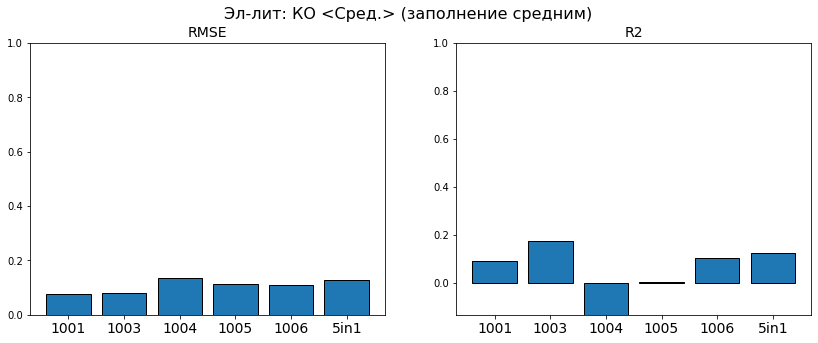

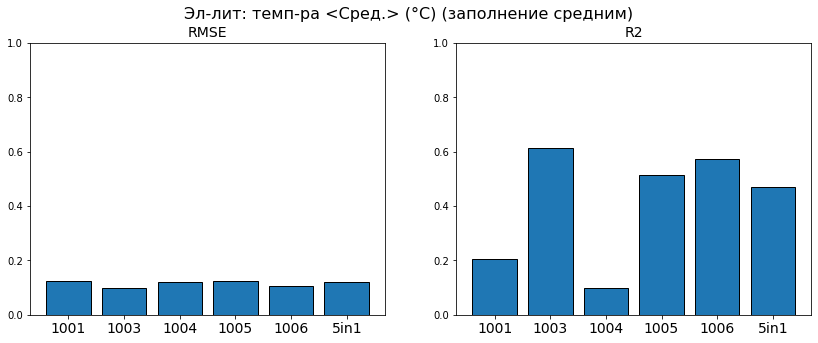

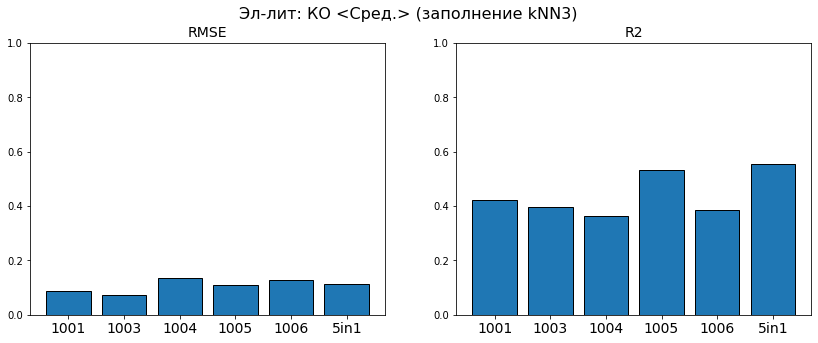

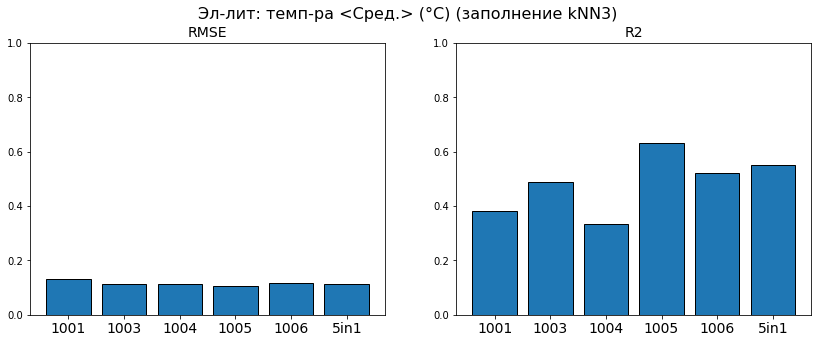

In [55]:
labelsBars=bathNumber[:]
labelsBars.append('5in1')

fig, ax = plt.subplots(ncols=2, figsize=(14,5))
ax[0].bar([0,1,2,3,4,5],rmseSVRMeanEKO, tick_label=labelsBars, ec='black')
ax[0].xaxis.set_tick_params(labelsize=14)
ax[0].set_ylim(0,1)
ax[0].set_title('RMSE', fontsize=14)
ax[1].bar([0,1,2,3,4,5],r2scoreSVRMeanEKO, tick_label=labelsBars, ec='black')
ax[1].xaxis.set_tick_params(labelsize=14)
ax[1].set_ylim(np.min([0, np.min([r2scoreSVRMeanEKO])]),1)
ax[1].set_title('R2', fontsize=14)
fig.suptitle(fullNamesInRussian[paramNames.index('EKO')]+' (заполнение средним)', fontsize=16)
plt.savefig('report_v2/resultsSVRImpMeanEKO.png', dpi=300, bbox_inches='tight')
plt.show()

fig, ax = plt.subplots(ncols=2, figsize=(14,5))
ax[0].bar([0,1,2,3,4,5],rmseSVRMeanETEMP, tick_label=labelsBars, ec='black')
ax[0].xaxis.set_tick_params(labelsize=14)
ax[0].set_ylim(0,1)
ax[0].set_title('RMSE', fontsize=14)
ax[1].bar([0,1,2,3,4,5],r2scoreSVRMeanETEMP, tick_label=labelsBars, ec='black')
ax[1].xaxis.set_tick_params(labelsize=14)
ax[1].set_ylim(np.min([0, np.min([r2scoreSVRMeanETEMP])]) ,1)
ax[1].set_title('R2', fontsize=14)
fig.suptitle(fullNamesInRussian[paramNames.index('ETEMP')]+' (заполнение средним)', fontsize=16)
plt.savefig('report_v2/resultsSVRImpMeanETEMP.png', dpi=300, bbox_inches='tight')
plt.show()

fig, ax = plt.subplots(ncols=2, figsize=(14,5))
ax[0].bar([0,1,2,3,4,5],rmseSVRKNN3EKO, tick_label=labelsBars, ec='black')
ax[0].xaxis.set_tick_params(labelsize=14)
ax[0].set_ylim(0,1)
ax[0].set_title('RMSE', fontsize=14)
ax[1].bar([0,1,2,3,4,5],r2scoreSVRKNN3EKO, tick_label=labelsBars, ec='black')
ax[1].xaxis.set_tick_params(labelsize=14)
ax[1].set_ylim(np.min([0, np.min([r2scoreSVRKNN3EKO])]),1)
ax[1].set_title('R2', fontsize=14)
fig.suptitle(fullNamesInRussian[paramNames.index('EKO')]+' (заполнение kNN3)', fontsize=16)
plt.savefig('report_v2/resultsSVRImpKNN3EKO.png', dpi=300, bbox_inches='tight')
plt.show()

fig, ax = plt.subplots(ncols=2, figsize=(14,5))
ax[0].bar([0,1,2,3,4,5],rmseSVRKNN3ETEMP, tick_label=labelsBars, ec='black')
ax[0].xaxis.set_tick_params(labelsize=14)
ax[0].set_ylim(0,1)
ax[0].set_title('RMSE', fontsize=14)
ax[1].bar([0,1,2,3,4,5],r2scoreSVRKNN3ETEMP, tick_label=labelsBars, ec='black')
ax[1].xaxis.set_tick_params(labelsize=14)
ax[1].set_ylim(np.min([0, np.min([r2scoreSVRKNN3ETEMP])]) ,1)
ax[1].set_title('R2', fontsize=14)
fig.suptitle(fullNamesInRussian[paramNames.index('ETEMP')]+' (заполнение kNN3)', fontsize=16)
plt.savefig('report_v2/resultsSVRImpKNN3ETEMP.png', dpi=300, bbox_inches='tight')
plt.show()

## модель SVR по 3 параметрам c наибольшей корреляцией

In [56]:
modelSVRMeanEKO=[None]*6
rmseSVRMeanEKO=[None]*6
r2scoreSVRMeanEKO=[None]*6

modelSVRMeanETEMP=[None]*6
rmseSVRMeanETEMP=[None]*6
r2scoreSVRMeanETEMP=[None]*6

modelSVRKNN3EKO=[None]*6
rmseSVRKNN3EKO=[None]*6
r2scoreSVRKNN3EKO=[None]*6

modelSVRKNN3ETEMP=[None]*6
rmseSVRKNN3ETEMP=[None]*6
r2scoreSVRKNN3ETEMP=[None]*6

for i in range(5):
    
    # среднее значение
    # по параметру EKO по ваннам
    trainInputsEKO = trainImpMean[i][['U1','AIF3','RMPR3']].values
    testInputsEKO = testImpMean[i][['U1','AIF3','RMPR3']].values
    trainTargetsEKO = trainImpMean[i]['EKO'].values
    testTargetsEKO = testImpMean[i]['EKO'].values


    parameters = {'C':[0.1, 0.5, 1, 2.5, 5, 7.5, 10], 'epsilon': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1]}
    modelSVR=SVR()
    gridSVR=GridSearchCV(modelSVR, parameters, scoring='neg_root_mean_squared_error')
    gridSVR.fit(trainInputsEKO,trainTargetsEKO)


    modelSVRMeanEKO[i] = gridSVR.best_estimator_
    modelSVRMeanEKO[i].fit(trainInputsEKO,trainTargetsEKO)
    predictedEKO = modelSVRMeanEKO[i].predict(testInputsEKO)
    
    rmseSVRMeanEKO[i] = mean_squared_error(testTargetsEKO, predictedEKO, squared=False)
    r2scoreSVRMeanEKO[i] = r2_score(testTargetsEKO, predictedEKO)

    # по параметру ETEMP по ваннам
    trainInputsETEMP = trainImpMean[i][['U1','AIF3','RMPR3']].values
    testInputsETEMP = testImpMean[i][['U1','AIF3','RMPR3']].values
    trainTargetsETEMP = trainImpMean[i]['ETEMP'].values
    testTargetsETEMP = testImpMean[i]['ETEMP'].values
    
    parameters = {'C':[0.1, 0.5, 1, 2.5, 5, 7.5, 10], 'epsilon': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1]}
    modelSVR=SVR()
    gridSVR=GridSearchCV(modelSVR, parameters, scoring='neg_root_mean_squared_error')
    gridSVR.fit(trainInputsETEMP,trainTargetsETEMP)


    modelSVRMeanETEMP[i] = gridSVR.best_estimator_
    modelSVRMeanETEMP[i].fit(trainInputsETEMP,trainTargetsETEMP)
    predictedETEMP = modelSVRMeanETEMP[i].predict(testInputsETEMP)
    
    rmseSVRMeanETEMP[i] = mean_squared_error(testTargetsETEMP, predictedETEMP, squared=False)
    r2scoreSVRMeanETEMP[i] = r2_score(testTargetsETEMP, predictedETEMP)


    # knn3
    # по параметру EKO по ваннам
    trainInputsEKO = trainImpKNN3[i][['U1','AIF3','RMPR3']].values
    testInputsEKO = testImpKNN3[i][['U1','AIF3','RMPR3']].values
    trainTargetsEKO = trainImpKNN3[i]['EKO'].values
    testTargetsEKO = testImpKNN3[i]['EKO'].values
    
    parameters = {'C':[0.1, 0.5, 1, 2.5, 5, 7.5, 10], 'epsilon': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1]}
    modelSVR=SVR()
    gridSVR=GridSearchCV(modelSVR, parameters, scoring='neg_root_mean_squared_error')
    gridSVR.fit(trainInputsEKO,trainTargetsEKO)


    modelSVRKNN3EKO[i] = gridSVR.best_estimator_
    modelSVRKNN3EKO[i].fit(trainInputsEKO,trainTargetsEKO)
    predictedEKO = modelSVRKNN3EKO[i].predict(testInputsEKO)
    
    rmseSVRKNN3EKO[i] = mean_squared_error(testTargetsEKO, predictedEKO, squared=False)
    r2scoreSVRKNN3EKO[i] = r2_score(testTargetsEKO, predictedEKO)

    # по параметру ETEMP по ваннам
    trainInputsETEMP = trainImpKNN3[i][['U1','AIF3','RMPR3']].values
    testInputsETEMP = testImpKNN3[i][['U1','AIF3','RMPR3']].values
    trainTargetsETEMP = trainImpKNN3[i]['ETEMP'].values
    testTargetsETEMP = testImpKNN3[i]['ETEMP'].values
    
    parameters = {'C':[0.1, 0.5, 1, 2.5, 5, 7.5, 10], 'epsilon': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1]}
    modelSVR=SVR()
    gridSVR=GridSearchCV(modelSVR, parameters, scoring='neg_root_mean_squared_error')
    gridSVR.fit(trainInputsETEMP,trainTargetsETEMP)


    modelSVRKNN3ETEMP[i] = gridSVR.best_estimator_
    modelSVRKNN3ETEMP[i].fit(trainInputsETEMP,trainTargetsETEMP)
    predictedETEMP = modelSVRKNN3ETEMP[i].predict(testInputsETEMP)
    
    rmseSVRKNN3ETEMP[i] = mean_squared_error(testTargetsETEMP, predictedETEMP, squared=False)
    r2scoreSVRKNN3ETEMP[i] = r2_score(testTargetsETEMP, predictedETEMP)


# среднее значение
# по параметру EKO 5-в-1
trainInputs5in1EKO = train5in1ImpMean[['U1','AIF3','RMPR3']].values
testInputs5in1EKO = test5in1ImpMean[['U1','AIF3','RMPR3']].values
trainTargets5in1EKO = train5in1ImpMean['EKO'].values
testTargets5in1EKO = test5in1ImpMean['EKO'].values

parameters = {'C':[0.5, 1, 2.5, 5, 7.5, 10], 'epsilon': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1]}
modelSVR=SVR()
gridSVR=GridSearchCV(modelSVR, parameters, scoring='neg_root_mean_squared_error')
gridSVR.fit(trainInputs5in1EKO,trainTargets5in1EKO)

modelSVRMeanEKO[5] = gridSVR.best_estimator_
modelSVRMeanEKO[5].fit(trainInputs5in1EKO, trainTargets5in1EKO)
predictedEKO = modelSVRMeanEKO[5].predict(testInputs5in1EKO)

rmseSVRMeanEKO[5] = mean_squared_error(testTargets5in1EKO, predictedEKO, squared=False)
r2scoreSVRMeanEKO[5] = r2_score(testTargets5in1EKO, predictedEKO)

# по параметру ETEMP 5-в-1
trainInputs5in1ETEMP = train5in1ImpMean[['U1','AIF3','RMPR3']].values
testInputs5in1ETEMP = test5in1ImpMean[['U1','AIF3','RMPR3']].values
trainTargets5in1ETEMP = train5in1ImpMean['ETEMP'].values
testTargets5in1ETEMP = test5in1ImpMean['ETEMP'].values

parameters = {'C':[0.5, 1, 2.5, 5, 7.5, 10], 'epsilon': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1]}
modelSVR=SVR()
gridSVR=GridSearchCV(modelSVR, parameters, scoring='neg_root_mean_squared_error')
gridSVR.fit(trainInputs5in1ETEMP,trainTargets5in1ETEMP)

modelSVRMeanETEMP[5] = gridSVR.best_estimator_
modelSVRMeanETEMP[5].fit(trainInputs5in1ETEMP, trainTargets5in1ETEMP)
predictedETEMP = modelSVRMeanETEMP[5].predict(testInputs5in1ETEMP)

rmseSVRMeanETEMP[5] = mean_squared_error(testTargets5in1ETEMP, predictedETEMP, squared=False)
r2scoreSVRMeanETEMP[5] = r2_score(testTargets5in1ETEMP, predictedETEMP)

# kNN3
# по параметру EKO 5-в-1
trainInputs5in1EKO = train5in1ImpKNN3[['U1','AIF3','RMPR3']].values
testInputs5in1EKO = test5in1ImpKNN3[['U1','AIF3','RMPR3']].values
trainTargets5in1EKO = train5in1ImpKNN3['EKO'].values
testTargets5in1EKO = test5in1ImpKNN3['EKO'].values

parameters = {'C':[0.5, 1, 2.5, 5, 7.5, 10], 'epsilon': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1]}
modelSVR=SVR()
gridSVR=GridSearchCV(modelSVR, parameters, scoring='neg_root_mean_squared_error')
gridSVR.fit(trainInputs5in1EKO,trainTargets5in1EKO)

modelSVRKNN3EKO[5] = gridSVR.best_estimator_
modelSVRKNN3EKO[5].fit(trainInputs5in1EKO, trainTargets5in1EKO)
predictedEKO = modelSVRKNN3EKO[5].predict(testInputs5in1EKO)

rmseSVRKNN3EKO[5] = mean_squared_error(testTargets5in1EKO, predictedEKO, squared=False)
r2scoreSVRKNN3EKO[5] = r2_score(testTargets5in1EKO, predictedEKO)

# по параметру ETEMP 5-в-1
trainInputs5in1ETEMP = train5in1ImpKNN3[['U1','AIF3','RMPR3']].values
testInputs5in1ETEMP = test5in1ImpKNN3[['U1','AIF3','RMPR3']].values
trainTargets5in1ETEMP = train5in1ImpKNN3['ETEMP'].values
testTargets5in1ETEMP = test5in1ImpKNN3['ETEMP'].values

parameters = {'C':[0.5, 1, 2.5, 5, 7.5, 10], 'epsilon': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1]}
modelSVR=SVR()
gridSVR=GridSearchCV(modelSVR, parameters, scoring='neg_root_mean_squared_error')
gridSVR.fit(trainInputs5in1ETEMP,trainTargets5in1ETEMP)

modelSVRKNN3ETEMP[5] = gridSVR.best_estimator_
modelSVRKNN3ETEMP[5].fit(trainInputs5in1ETEMP, trainTargets5in1ETEMP)
predictedETEMP = modelSVRKNN3ETEMP[5].predict(testInputs5in1ETEMP)

rmseSVRKNN3ETEMP[5] = mean_squared_error(testTargets5in1ETEMP, predictedETEMP, squared=False)
r2scoreSVRKNN3ETEMP[5] = r2_score(testTargets5in1ETEMP, predictedETEMP)

In [57]:
rezEKOGridSVRmaxCorr=pd.DataFrame( 
        {
            'RMSE_mean': rmseSVRMeanEKO, 
            'R2_mean': r2scoreSVRMeanEKO,
            'RMSE_knn3': rmseSVRKNN3EKO, 
            'R2_knn3': r2scoreSVRKNN3EKO,
        },
        index=['1001','1003','1004','1005','1006', '5in1']
    )
rezEKOGridSVRmaxCorr

,RMSE_mean,R2_mean,RMSE_knn3,R2_knn3
1001,0.077564,0.032353,0.105960,0.130553
1003,0.086404,0.040625,0.087284,0.160860
1004,0.123483,0.049637,0.146765,0.247544
1005,0.114745,-0.016693,0.123359,0.422968
1006,0.115907,0.017466,0.142216,0.257085
5in1,0.131493,0.059808,0.144568,0.264946


In [58]:
rezETEMPGridSVRmaxCorr=pd.DataFrame( 
        {
            'RMSE_mean': rmseSVRMeanETEMP, 
            'R2_mean': r2scoreSVRMeanETEMP,
            'RMSE_knn3': rmseSVRKNN3ETEMP, 
            'R2_knn3': r2scoreSVRKNN3ETEMP,
        },
        index=['1001','1003','1004','1005','1006', '5in1']
    )
rezETEMPGridSVRmaxCorr

,RMSE_mean,R2_mean,RMSE_knn3,R2_knn3
1001,0.121085,0.258821,0.147614,0.211606
1003,0.101327,0.590788,0.106153,0.558405
1004,0.126830,0.025891,0.114046,0.307117
1005,0.132948,0.456780,0.117750,0.547106
1006,0.107049,0.549561,0.125911,0.435904
5in1,0.127957,0.412842,0.129833,0.427437


In [59]:
# сохраним в excel
writer = pd.ExcelWriter('report_v2\\rezGridSVRmaxCorr.xlsx', engine='xlsxwriter')
rezEKOGridSVRmaxCorr.to_excel(writer, sheet_name='Эл-лит КО cред.')
rezETEMPGridSVRmaxCorr.to_excel(writer, sheet_name='Эл-лит темп-ра cред.')
writer.save()

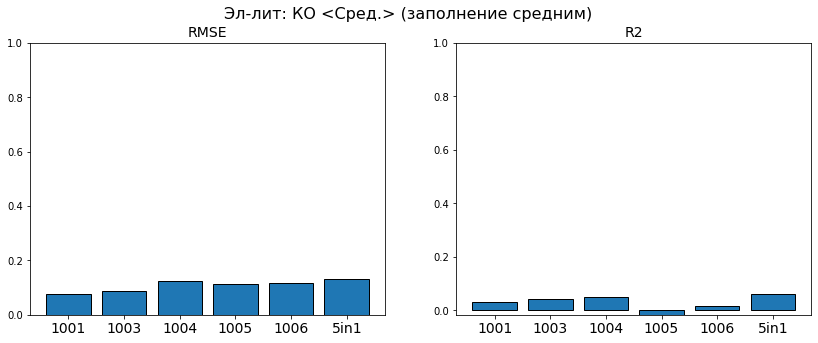

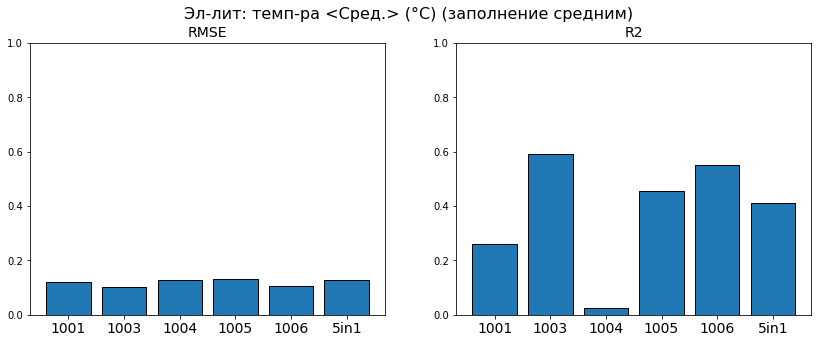

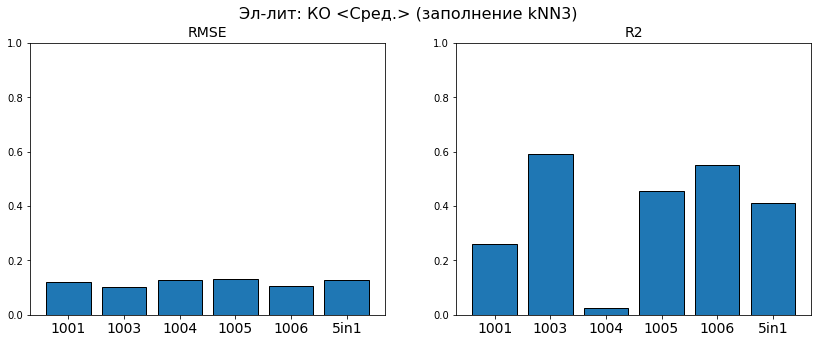

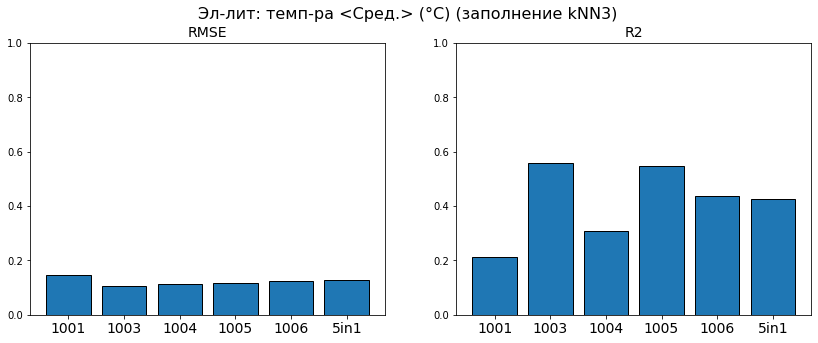

In [60]:
labelsBars=bathNumber[:]
labelsBars.append('5in1')

fig, ax = plt.subplots(ncols=2, figsize=(14,5))
ax[0].bar([0,1,2,3,4,5],rmseSVRMeanEKO, tick_label=labelsBars, ec='black')
ax[0].xaxis.set_tick_params(labelsize=14)
ax[0].set_ylim(0,1)
ax[0].set_title('RMSE', fontsize=14)
ax[1].bar([0,1,2,3,4,5],r2scoreSVRMeanEKO, tick_label=labelsBars, ec='black')
ax[1].xaxis.set_tick_params(labelsize=14)
ax[1].set_ylim(np.min([0, np.min([r2scoreSVRMeanEKO])]),1)
ax[1].set_title('R2', fontsize=14)
fig.suptitle(fullNamesInRussian[paramNames.index('EKO')]+' (заполнение средним)', fontsize=16)
plt.savefig('report_v2/resultsSVRmaxCorrImpMeanEKO.png', dpi=300, bbox_inches='tight')
plt.show()

fig, ax = plt.subplots(ncols=2, figsize=(14,5))
ax[0].bar([0,1,2,3,4,5],rmseSVRMeanETEMP, tick_label=labelsBars, ec='black')
ax[0].xaxis.set_tick_params(labelsize=14)
ax[0].set_ylim(0,1)
ax[0].set_title('RMSE', fontsize=14)
ax[1].bar([0,1,2,3,4,5],r2scoreSVRMeanETEMP, tick_label=labelsBars, ec='black')
ax[1].xaxis.set_tick_params(labelsize=14)
ax[1].set_ylim(np.min([0, np.min([r2scoreSVRMeanETEMP])]) ,1)
ax[1].set_title('R2', fontsize=14)
fig.suptitle(fullNamesInRussian[paramNames.index('ETEMP')]+' (заполнение средним)', fontsize=16)
plt.savefig('report_v2/resultsSVRmaxCorrImpMeanETEMP.png', dpi=300, bbox_inches='tight')
plt.show()


fig, ax = plt.subplots(ncols=2, figsize=(14,5))
ax[0].bar([0,1,2,3,4,5],rmseSVRMeanETEMP, tick_label=labelsBars, ec='black')
ax[0].xaxis.set_tick_params(labelsize=14)
ax[0].set_ylim(0,1)
ax[0].set_title('RMSE', fontsize=14)
ax[1].bar([0,1,2,3,4,5],r2scoreSVRMeanETEMP, tick_label=labelsBars, ec='black')
ax[1].xaxis.set_tick_params(labelsize=14)
ax[1].set_ylim(np.min([0, np.min([r2scoreSVRMeanETEMP])]),1)
ax[1].set_title('R2', fontsize=14)
fig.suptitle(fullNamesInRussian[paramNames.index('EKO')]+' (заполнение kNN3)', fontsize=16)
plt.savefig('report_v2/resultsSVRmaxCorrImpKNN3EKO.png', dpi=300, bbox_inches='tight')
plt.show()

fig, ax = plt.subplots(ncols=2, figsize=(14,5))
ax[0].bar([0,1,2,3,4,5],rmseSVRKNN3ETEMP, tick_label=labelsBars, ec='black')
ax[0].xaxis.set_tick_params(labelsize=14)
ax[0].set_ylim(0,1)
ax[0].set_title('RMSE', fontsize=14)
ax[1].bar([0,1,2,3,4,5],r2scoreSVRKNN3ETEMP, tick_label=labelsBars, ec='black')
ax[1].xaxis.set_tick_params(labelsize=14)
ax[1].set_ylim(np.min([0, np.min([r2scoreSVRKNN3ETEMP])]) ,1)
ax[1].set_title('R2', fontsize=14)
fig.suptitle(fullNamesInRussian[paramNames.index('ETEMP')]+' (заполнение kNN3)', fontsize=16)
plt.savefig('report_v2/resultsSVRmaxCorrImpKNN3ETEMP.png', dpi=300, bbox_inches='tight')
plt.show()